# Setup

## Imports

In [1]:
# Imports

import datetime as dt
import random
import time
from datetime import datetime
from pprint import pprint

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.ticker as ticks
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
import spacy
from sklearn.decomposition import NMF

from IPython.display import HTML
from nltk.corpus import stopwords
from pandas.plotting import register_matplotlib_converters
from pymongo import MongoClient
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from spacy.lang.en import English
from vaderSentiment import vaderSentiment

spacy_nlp = spacy.load("en_core_web_sm")

sns.set()
register_matplotlib_converters()

In [2]:
# Connect to Mongo

client = MongoClient()
db = client.test
print("Collections: ", db.list_collection_names())

Collections:  ['scrape_dec4']


In [3]:
collection = db.scrape_dec4

In [4]:
# Model Name Generator

with open('./data/random_words_for_model_names.txt','r') as file:
    random_words = file.readlines()

## General Utility Functions

In [5]:
def flatten_discussion(d):
    '''
    
    Merge all comments and posts into a single thread,
    given a dictionary containing threads at the high level,
    and a list of comments in a key-value pair.
    
    '''

    l = []

    s = {}
    s['id'] = d['id']
    s['created'] = d['created']
    s['author'] = d['author']
    s['permalink'] = d['permalink']
    title = d['title']
    s['body'] = 'POST_TITLE:  ' + title + '\nPOST_BODY:  ' + d['selftext']
    s['class'] = 'Post'

    l.append(s)

    # do the same for the comments

    for comment in d['comments']:
        comment['id'] = s['id']
        comment['class'] = 'Comment'
        l.append(comment)

    return l

## NLP & Topic Modeling Functions

In [6]:
# NLP Setup Functions

nlp = English()
sentencizer = nlp.create_pipe("sentencizer")
nlp.add_pipe(sentencizer)
# e.g. doc = nlp("This is a sentence. This is another sentence.")
# doc now has sentences property, which contains a subset of doc's tokens

analyzer = vaderSentiment.SentimentIntensityAnalyzer()

def vader_compound_polarity(text):
    return analyzer.polarity_scores(text)['compound']

In [50]:
# Stop Word Config
swds_reddit_and_web = ([
    'reddit', 'subreddit', 'post', 'comment',
    'html', 'com', 'utm', 'www', 'http', 'https',
    'sub',  # not sure if this one should be included...
    'medium',
    'deleted', 'delete', 'removed',
    'x200b', 'op', 'r',
])

swds_general_gaming = ([
])

swds_stadia = ([
])

swds_artifacts = ([
    've', 'don', 'also'
])


def custom_stop_words(custom_stop_lists, stop_english=True):
    '''

    Takes a list of lists of custom stop words,
    and forms a custom stop words list.

    '''

    swds_custom = []

    if stop_english:
        swds_custom.extend(stopwords.words('english'))

    for wordlist in custom_stop_lists:
        #         print(wordlist)
        if len(wordlist) > 0:
            swds_custom.extend(wordlist)

    return swds_custom

# Test:
# np.array(custom_stop_words([swds_reddit_and_web], stop_english=False))

In [8]:
######## NMF Model Functions ###########


class Custom_NMF(object):
    '''

    Custom NMF model.

    corpora: tokenized list of values
    vectorizer: custom vectorizer function (e.g. TF-IDF)
    n_components: number of topics

    '''

    def __init__(self, n_components):

        random_name = random.choice(random_words).strip(
        ) + "-" + random.choice(random_words).strip()

        self.id = 'SubRel-TM-' + random_name + '–' + str(int(time.time()))
        print('Model Name:', self.id)

        # Initialize NMF Model:
        model = NMF(n_components=n_components, random_state=42)
        self.n_components = n_components
        self.model = model

    def fit_and_return_top_topics(self, corpora, vectorizer,
                                  verbose=False, top_n=50,
                                  description=None):

        # Fit Vectorizer
        print('Fitting NMF Model -', dt.datetime.now().time())
        doc_term_matrix = vectorizer.fit_transform(corpora)
        print('Document Term Matrix... Done -', dt.datetime.now().time())

        # Fit model
        doc_topic_matrix = self.model.fit_transform(doc_term_matrix)
        print('Model Fit, Document Topic Matrix... Done - ',
              dt.datetime.now().time())

        # Rename Columns of document topic matrix
        topic_column_names = ['topic_'+str(i)
                              for i in range(self.n_components)]

        # Get classification counts for each document:
        topic_ranks = np.argsort(-doc_topic_matrix, axis=1)
        doc_topic_sums = doc_topic_matrix.sum(axis=1)

        doc_main_topics = topic_ranks[:, 0]
        doc_main_topic_pcts = doc_topic_matrix.max(axis=1)/doc_topic_sums

        doc_secondary_topics = topic_ranks[:, 1]
        doc_mean_topic_pcts = doc_topic_matrix.mean(axis=0)

        topic_num, counts = np.unique(doc_main_topics, return_counts=True)

        topic_counts = dict(zip(topic_num, counts))

        self.topic_term_components = self.model.components_
        print('Topic Term Components... Done -', dt.datetime.now().time())

        # Get Top Words
        self.topic_dict = {}
        self.topics_list = []
        for topic_num, cmp in enumerate(self.topic_term_components):
            top_ind = cmp.argsort()[-top_n:][::-1]
            top_words = [(vectorizer.get_feature_names()[ind],
                          round(cmp[ind], 3)) for ind in top_ind]
            count = topic_counts[topic_num]
            self.topic_dict[topic_num] = {}
            self.topic_dict[topic_num]['value_count'] = count
            self.topic_dict[topic_num]['top_words'] = top_words
            self.topics_list += [[topic_num, word, importance]
                                 for (word, importance) in top_words]

        self.topic_output = pd.DataFrame.from_records(
            self.topics_list, columns=['main_topic', 'word', 'salience']
        )

        self.topic_output['Model_ID'] = self.id

        if verbose:
            pprint(self.topic_dict)

        print('Reconstruction error:', self.model.reconstruction_err_)
        print('Iterations:', self.model.n_iter_)

        return doc_main_topics, doc_main_topic_pcts, doc_secondary_topics, doc_mean_topic_pcts

## MongoDB Query Template

In [113]:
# Available fields that can be queried in 
submission_fields = ([
    'author', 'author_flair_text', 'can_mod_post',
    'all_awardings', 'gildings', 'total_awards_received', 'pinned', 'num_comments', 'num_crossposts',
    'created_utc', 'created',
    'subreddit','subreddit_id', 'subreddit_subscribers',
    'id', 'permalink', 'url',
    'is_meta','is_original_content','is_self','is_video',
    'score','pwls', 'wls', 'ups','upvote_ratio','downs',
    'selftext', 'title'
])

# subfields available as keys for entries in comments
comment_fields = ([
    'author', 'author_flair_text', 'can_mod_post',
    'all_awardings', 'gildings',
    'created_utc', 'created',
    'id', 'permalink', 'submission',
    'score','controversiality','score_hidden',
    'body', 'banned_at_utc','banned_by'
])

In [114]:
db.list_collection_names()

['scrape_nov19', 'scrape_nov19_subset']

In [115]:
# MongoDB Filter and Projection config
collection = db.scrape_nov19

db_filter = [
#     {'$match': {'$and': [
#                        {'score' : {'$gt': 5}}]}
#     },
    {'$limit': 1}
]

db_projection = ([
    {'$project': {'_id': 0,  'created_utc':1, 'author':1, 'comments': {'author':1, 'created_utc':1}, 'permalink':1 }
    }
])

filter_and_projection = []
filter_and_projection.extend(db_filter)
filter_and_projection.extend(db_projection)
filter_and_projection

[{'$limit': 1},
 {'$project': {'_id': 0,
   'created_utc': 1,
   'author': 1,
   'comments': {'author': 1, 'created_utc': 1},
   'permalink': 1}}]

In [116]:
threads = list(collection.aggregate(filter_and_projection))
threads[0]

{'author': 'TheChappellShow',
 'created_utc': 1574053183.0,
 'permalink': '/r/Stadia/comments/dxyjj6/shipping_date_pushed_back/',
 'comments': [{'author': 'cderry', 'created_utc': 1574057588.0},
  {'author': 'RossR180', 'created_utc': 1574053730.0},
  {'author': 'IAintGud', 'created_utc': 1574053911.0}]}

# EDA: Basic User Metrics (Frequency)

## Unique Users / Posts over time

### Pull data from Mongo

In [5]:
db_filter = [
#     {'$match': {'$and': [
#                        {'score' : {'$gt': 5}}]}
#     },
#     {'$limit': 100}
]

db_projection = ([
    {'$project': {'_id': 0,  'created':1, 'author':1, 'comments': {'author':1, 'created':1}, 'permalink':1}
    }
])

filter_and_projection = []
filter_and_projection.extend(db_filter)
filter_and_projection.extend(db_projection)
filter_and_projection

[{'$project': {'_id': 0,
   'created': 1,
   'author': 1,
   'comments': {'author': 1, 'created': 1},
   'permalink': 1}}]

In [6]:
collection = db.scrape_dec4

In [7]:
# Pull samples from Database

authors_sample = list( collection.aggregate(filter_and_projection))

# Flatten dictionary of submissions and their authors into dataframe:

stream = []
for submission in authors_sample:
    stream.append([submission['author'], submission['created']])
    for c in submission['comments']:
        stream.append([ c['author'], c['created'] ])

del authors_sample
        
# stream[:10]
df = pd.DataFrame.from_records(stream, columns = ['author', 'created'])
df['created'] = pd.to_datetime(df['created'], unit='s')
df = df.sort_values(by='created').reset_index()
df.head()

,index,author,created
0,161807,sunlitcheerios,2019-02-27 09:50:49
1,161780,SeasTV,2019-03-20 01:23:25
2,161741,InfiniZ,2019-03-20 01:23:35
3,160149,Labbed,2019-03-20 01:23:50
4,160148,edgelord_gg,2019-03-20 01:26:19


### Unique Submissions Over time

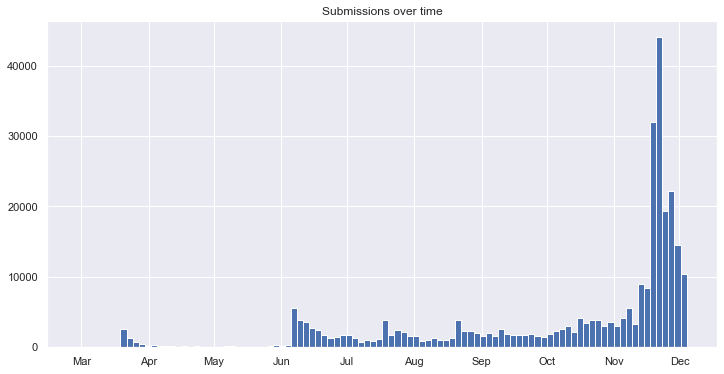

In [7]:
# Posts over time
# Surge of posts upon release of subreddit

fig, ax = plt.subplots(figsize=(12,6))

plt.hist(x ='created', data = df, bins=100)

ax = plt.gca()

ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
# ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

plt.title("Submissions over time");

### Unique Users in Subreddit Over Time

In [55]:
user_debuts.shape

(14093, 3)

In [8]:
# Rolling count of total users as they enter the discussion

user_debuts = df.groupby('author').created.min().sort_values()
user_debuts = user_debuts.reset_index()
user_debuts['unique_users'] = user_debuts.index + 1
user_debuts.head()

,author,created,unique_users
0,sunlitcheerios,2019-02-27 09:50:49,1
1,SeasTV,2019-03-20 01:23:25,2
2,InfiniZ,2019-03-20 01:23:35,3
3,Labbed,2019-03-20 01:23:50,4
4,edgelord_gg,2019-03-20 01:26:19,5


In [10]:
user_debuts['date'] = user_debuts.created.dt.date

user_debuts.groupby('date')['unique_users'].max().to_csv('./data/user_growth_by_day.csv', header=True)

In [12]:
ud = user_debuts.groupby('date')['unique_users'].max().reset_index().to_dict(orient='records')
# ud

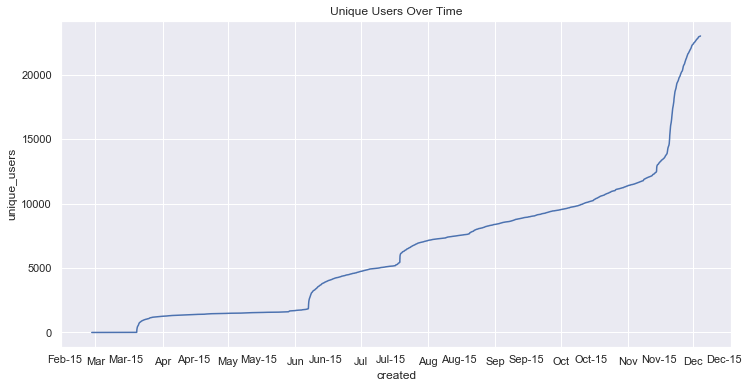

In [13]:
fig, ax = plt.subplots(figsize=(12,6))

sns.lineplot(x='created',y='unique_users', data=user_debuts)

# x-axis limits, for date:
# ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 6, 1))

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

plt.title('Unique Users Over Time')
plt.show();

### Unique Posts / Users

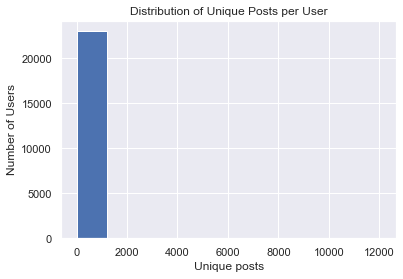

In [14]:
user_unique_post_count = df.groupby('author').created.nunique()
plt.hist(user_unique_post_count)

plt.xlabel('Unique posts')
plt.ylabel('Number of Users')
plt.title('Distribution of Unique Posts per User');

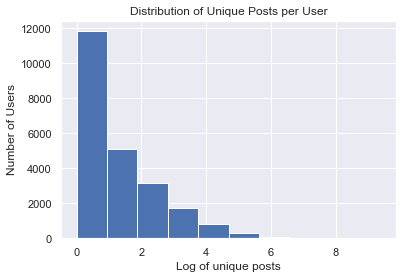

In [15]:
user_unique_post_count = df.groupby('author').created.nunique()
plt.hist(np.log(user_unique_post_count))

plt.xlabel('Log of unique posts')
plt.ylabel('Number of Users')
plt.title('Distribution of Unique Posts per User');

# Sentiment Analysis

### Pull from Mongo

In [8]:
# Set up filter for database query
db_filter = [
#     {'$match': {'$and': [
#                        {'score' : {'$gt': 5}}]}
#     },
#     {'$limit': 100}
]

db_projection = ([
    {'$project': {'_id': 0,  'created':1, 'author':1, 'title':1, 'selftext':1, 'id':1, 'permalink':1,
                  'comments': { 'author':1, 'created':1, 'body':1, 'permalink':1 } }
    }
])

filter_and_projection = []
filter_and_projection.extend(db_filter)
filter_and_projection.extend(db_projection)

In [9]:
threads = list( collection.aggregate(filter_and_projection))

In [10]:
len(threads)

20314

In [11]:
flattened = []

for d in threads:
    flattened.extend(flatten_discussion(d))

df_discuss = pd.DataFrame.from_dict(flattened)

del threads

df_discuss['created'] = pd.to_datetime(df_discuss['created'], unit='s')

# Append reddit domain to permalink:
df_discuss.permalink = "<a href='https://www.reddit.com" + df_discuss.permalink + "'>Thread</a>"

In [17]:
HTML(df_discuss.head().to_html(escape=False))

,id,created,author,permalink,body,class
0,dxyjj6,2019-11-18 12:59:43,TheChappellShow,Thread,"POST_TITLE: Shipping date pushed back?\nPOST_BODY: I know how much everyone hates shipping threads, I KNOW, but for past 2 weeks it was expected 22-25 of November. Checked again today and now it's 27-28 of November. What could've caused this to be changed? I figured it would be bumped up closer if anything after people cancelling.",Post
1,dxyjj6,2019-11-18 14:13:08,cderry,Thread,https://www.reddit.com/r/Stadia/comments/dxqx31/stadia_anticipation_megathread_post_shipping/,Comment
2,dxyjj6,2019-11-18 13:08:50,RossR180,Thread,"People cancelling won't up your delivery date, they're all sent to specific places in different countries together in specific amounts before they are shipped out to individuals so people cancelling doesn't make any difference.",Comment
3,dxyjj6,2019-11-18 13:11:51,IAintGud,Thread,"The same thing happened to me only my first date was the same as yours and my new date is Nov 27-Dec 2 even though I ordered on June 6th. I had opened a inquiry with their customer support for an unrelated thing (wanted to change to expedited shipping, you cant change your order more than 60 min after purchase) and after my question was answered they asked if I had any other questions. This was before the AMA so I asked about when my order would get shipped. They said they would escalate it and get back to me. I received an email saying it was sent to a different group and I did not hear anything back. Then I saw my order switched to a week later so I emailed the guy who had my inquiry and asked about the change in date. His response was....\n\n""This is Jerry with the Shipping and Refunds team here at Google. Thanks for responding to this email. We can still stick to the Estimated delivery date which is between Nov 22 - Nov 25 2019. Once your order is ready for shipment. I will send you an email to confirm the shipment of this order.\n\nIf you have any questions, feel free to ask. If you reply to this email, it goes back to me directly.""",Comment
4,dxyfkc,2019-11-18 12:48:55,runningboy311,Thread,"POST_TITLE: Will any games support split screen / couch co-op at launch?\nPOST_BODY: I noticed Darksiders Genesis will support split screen on Steam when it comes out in December, so I'm hoping it will be the same on Stadia, but was curious if this feature is supported on the Stadia platform itself yet? Might be time to order a second controller if so!",Post


### Study Post Frequency / User

In [12]:
user_post_counts = df_discuss.groupby(by='author')['created'].count()
user_post_counts.describe()

count    23022.000000
mean        13.018808
std        104.668171
min          1.000000
25%          1.000000
50%          2.000000
75%          7.000000
max      12080.000000
Name: created, dtype: float64

In [13]:
user_post_counts.sort_values(ascending=False)[:10]

author
None             12080
Skeeter1020       5426
la2eee            3061
AutoModerator     2694
bartturner        2157
tekcomms          1851
smita16           1821
ltnew007          1720
Gerolux           1622
smiller171        1369
Name: created, dtype: int64

Ok, some bot must be posting a bunch of times. `author=None`?

In [49]:
# View some posts where author=None
HTML(df_discuss[df_discuss.author=='None'][['author','body','permalink']].sample(10).to_html(escape=False))

,author,body,permalink
157515,None,"Lol, the one thing Google is very much doing ***is*** competing with traditional consoles.\n\nI mean common, the controller, Chromecast, Doom, Assassins Creed. What part of that isnt aiming for TV based arm chair gaming crowd?",Thread
24894,None,"POST_TITLE: Google issues account permabans for many of Markiplier's users during a youtube livestream for using too many emotes. This locks them out of their Youtube and GMail accounts. Google refuses to overturn the bans, and Markiplier is pissed.\nPOST_BODY: [deleted]",Thread
146207,None,Would you like to participate in the wager?,Thread
89446,None,Don't you have any HDMI inputs free in your TV to connect Chromecast and just keep your Apple stuff way they are?,Thread
70753,None,[deleted],Thread
151105,None,"You don't own any of your Steam games. I have over 700 titles in my Steam library and I don't own a single one. I, like you, are merely licensing them.",Thread
155440,None,"POST_TITLE: Finally, a way to enjoy triple A games without dishing out 1K+ money on a high end PC build.\nPOST_BODY: [deleted]",Thread
118047,None,[deleted],Thread
42671,None,[deleted],Thread
127767,None,POST_TITLE: Stadia specific Chromebook?\nPOST_BODY: [deleted],Thread


After inspecting comments, it looks like these posts are all by deleted accounts. `None` accounts are deleted accounts. We will have to treat this collection of users differently.

### Create User Categories by quantity of posts (leaving alone top posters)

In [14]:
r = np.linspace(-1, 14, 16)
buckets = 2**r
tier_labels = [str(int(2**(val))) + '-' + str(int(2**(val+1))) for val in r[1:]]
print('tiers of users:\n', tier_labels)
df_user_profiles = pd.DataFrame(data=user_post_counts).rename(columns = {'created':'nunique_posts'}).reset_index()
# df_user_profiles['author'] = np.array(user_post_counts.index)
df_user_profiles['post_quant_tier'] = pd.cut(df_user_profiles.nunique_posts, buckets, labels = tier_labels)
df_user_profiles

tiers of users:
 ['1-2', '2-4', '4-8', '8-16', '16-32', '32-64', '64-128', '128-256', '256-512', '512-1024', '1024-2048', '2048-4096', '4096-8192', '8192-16384', '16384-32768']


,author,nunique_posts,post_quant_tier
0,---KC---,2,2-4
1,--Dare--,40,64-128
2,--Paul--,5,8-16
3,--__-_-_-_-_-__--,1,1-2
4,-Aeryn-,1,1-2
...,...,...,...
23017,zyphe84,5,8-16
23018,zyzz193,10,16-32
23019,zzlag,14,16-32
23020,zzzjoshzzz,1,1-2


In [ ]:
df.sort_values(by='vader_compound')

In [16]:
# Create a dictionary mapping for use in a dataframe apply function
user_class_map = df_user_profiles[['author', 'post_tier_w_authors']].set_index('author').to_dict(orient='dict')['post_tier_w_authors']

In [17]:
user_class_map['TyHarvey']

'users with 1024-2048 posts'

In [362]:
df.sort_values(by='vader_compound').head()

,id,created_utc,title,text,author,class,permalink,score,created_ts,lemmatized,vader_compound,main_topic,main_topic_weight,secondary_topic,Model_ID,day_of_year,month_of_year,month,Topic Alias
29148,e0w64y,1.574586e+09,A future cloud FPS battlefield game; a ongoing...,A future cloud FPS battlefield game; a ongoing...,drschaulin,post,<a href='https://www.reddit.com/r/Stadia/comme...,NaN,2019-11-24 08:57:46,"[(future, ADJ), (cloud, NOUN), (battlefield, N...",-0.9974,3,0.150424,0,SubRel-TM-Pygmalion-Jacqueline–1575570280,2019-11-24,11,Nov-2019,Anxiety over Product Delivery
26431,e3evy9,1.575035e+09,Stadia has made gaming hardware irrelevant and...,Stadia has made gaming hardware irrelevant and...,mystilleef,post,<a href='https://www.reddit.com/r/Stadia/comme...,NaN,2019-11-29 13:41:48,"[(have, VERB), (make, VERB), (gaming, NOUN), (...",-0.9967,2,0.159486,0,SubRel-TM-Pygmalion-Jacqueline–1575570280,2019-11-29,11,Nov-2019,Community Oriented
12490,d2m353,1.568185e+09,"Really good answer to ""Google will kill it"" no...","Really good answer to ""Google will kill it"" no...",pcigre,post,<a href='https://www.reddit.com/r/Stadia/comme...,NaN,2019-09-11 06:55:34,"[(really, ADV), (good, ADJ), (answer, NOUN), (...",-0.9954,10,0.159407,9,SubRel-TM-Pygmalion-Jacqueline–1575570280,2019-09-11,9,Sep-2019,---
27531,e34wq0,1.574982e+09,Destiny-veteran here and ready to help new Sta...,Whoah! Great questions! \n\n\n1. There are ma...,EAGLESOUL5,comment,<a href='https://www.reddit.com/r/Stadia/comme...,25.0,2019-11-28 23:07:27,"[(great, ADJ), (question, NOUN), (there, ADV),...",-0.9946,19,0.259062,13,SubRel-TM-Pygmalion-Jacqueline–1575570280,2019-11-28,11,Nov-2019,Excitement over Product Launch
16586,c3363f,1.561076e+09,Another believer - sorta,Reviewers need to stop taking into account low...,NavySubmariner,comment,<a href='https://www.reddit.com/r/Stadia/comme...,32.0,2019-06-21 00:06:38,"[(reviewer, NOUN), (need, VERB), (stop, VERB),...",-0.9941,1,0.180297,8,SubRel-TM-Pygmalion-Jacqueline–1575570280,2019-06-21,6,Jun-2019,Anxiety over Product Delivery


In [18]:
df_discuss['user_post_quantity_tier'] = df_discuss.author.apply(lambda x: user_class_map[x])
HTML(df_discuss.head().to_html(escape=False))

,id,created,author,permalink,body,class,user_post_quantity_tier
0,dxyjj6,2019-11-18 12:59:43,TheChappellShow,Thread,"POST_TITLE: Shipping date pushed back?\nPOST_BODY: I know how much everyone hates shipping threads, I KNOW, but for past 2 weeks it was expected 22-25 of November. Checked again today and now it's 27-28 of November. What could've caused this to be changed? I figured it would be bumped up closer if anything after people cancelling.",Post,users with 4-8 posts
1,dxyjj6,2019-11-18 14:13:08,cderry,Thread,https://www.reddit.com/r/Stadia/comments/dxqx31/stadia_anticipation_megathread_post_shipping/,Comment,users with 256-512 posts
2,dxyjj6,2019-11-18 13:08:50,RossR180,Thread,"People cancelling won't up your delivery date, they're all sent to specific places in different countries together in specific amounts before they are shipped out to individuals so people cancelling doesn't make any difference.",Comment,users with 128-256 posts
3,dxyjj6,2019-11-18 13:11:51,IAintGud,Thread,"The same thing happened to me only my first date was the same as yours and my new date is Nov 27-Dec 2 even though I ordered on June 6th. I had opened a inquiry with their customer support for an unrelated thing (wanted to change to expedited shipping, you cant change your order more than 60 min after purchase) and after my question was answered they asked if I had any other questions. This was before the AMA so I asked about when my order would get shipped. They said they would escalate it and get back to me. I received an email saying it was sent to a different group and I did not hear anything back. Then I saw my order switched to a week later so I emailed the guy who had my inquiry and asked about the change in date. His response was....\n\n""This is Jerry with the Shipping and Refunds team here at Google. Thanks for responding to this email. We can still stick to the Estimated delivery date which is between Nov 22 - Nov 25 2019. Once your order is ready for shipment. I will send you an email to confirm the shipment of this order.\n\nIf you have any questions, feel free to ask. If you reply to this email, it goes back to me directly.""",Comment,users with 512-1024 posts
4,dxyfkc,2019-11-18 12:48:55,runningboy311,Thread,"POST_TITLE: Will any games support split screen / couch co-op at launch?\nPOST_BODY: I noticed Darksiders Genesis will support split screen on Steam when it comes out in December, so I'm hoping it will be the same on Stadia, but was curious if this feature is supported on the Stadia platform itself yet? Might be time to order a second controller if so!",Post,users with 128-256 posts


## Sentiment Analysis Prototype

In [23]:
df_discuss['vader_compound'] = df_discuss.body[df_discuss.body != '[deleted]'].apply(vader_compound_polarity)

In [24]:
df_discuss.vader_compound.describe()

count    296868.000000
mean          0.208696
std           0.457065
min          -0.998200
25%           0.000000
50%           0.165500
75%           0.592700
max           0.999800
Name: vader_compound, dtype: float64

In [41]:
n = 5
print(f'Top {n} Posts with low sentiment:')
print(df_discuss.sort_values(by='vader_compound')[['body','vader_compound']].head(1000).sample(5).values)
print('')
print(f'Top {n} Posts with high sentiment:')
print(df_discuss.sort_values(by='vader_compound', ascending=False)[['body','vader_compound']].head(1000).sample(5).values)

Top 5 Posts with low sentiment:
[["I'm about to, but the problem is nothing works better for me. I hate Samsung and I had a new iPad and didn't like the apple software/system 😭"
  -0.9614]
 ["If you actually listen to the videos like Jim Sterling's he explains why Stadia is trash. There are sources throughout the video, i.e. when he explains missing features on Google Stadia. Google Stadia is getting the backlash it is getting because it is a platform made in 2019 they doesn't even have features of last gen. Another point worth noting is Jedi The Fallen Order, was supposed to come to Stadia at launch. Nope. You want blockbusters? R6: Siege. Nope. No Man's Sky. Nope. Kingdom Hearts 3, Modern Warfare, GTA 5, heck even Fortnite. Nope. Stadia's lineup is not even impressive at all.\n\nYou can't even Play Stadia in 4k until 2020, so wtf. No buddy pass until weeks later. So I'm predicting Stadia is going to be a ghost town online. I mean, of course. That's why everyone's pushing for crosspla

In [29]:
df_discuss['date'] = df_discuss.created.dt.date
df_discuss.head(1)

,id,created,author,permalink,body,class,user_post_quantity_tier,vader_compound,date
0,dxyjj6,2019-11-18 12:59:43,TheChappellShow,<a href='https://www.reddit.com/r/Stadia/comme...,POST_TITLE: Shipping date pushed back?\nPOST_...,Post,users with 4-8 posts,-0.5439,2019-11-18


In [30]:
df_discuss['week'] = df_discuss.created.dt.week
df_discuss.week.head(3)

0    47
1    47
2    47
Name: week, dtype: int64

In [31]:
buckets = np.linspace(-1, 1, 21)
df_discuss['cmp_sentiment_bucket'] = pd.cut(df_discuss.vader_compound, buckets)
len(buckets)

21

In [32]:
df_discuss.head()

,id,created,author,permalink,body,class,user_post_quantity_tier,vader_compound,date,week,cmp_sentiment_bucket
0,dxyjj6,2019-11-18 12:59:43,TheChappellShow,<a href='https://www.reddit.com/r/Stadia/comme...,POST_TITLE: Shipping date pushed back?\nPOST_...,Post,users with 4-8 posts,-0.5439,2019-11-18,47,"(-0.6, -0.5]"
1,dxyjj6,2019-11-18 14:13:08,cderry,<a href='https://www.reddit.com/r/Stadia/comme...,https://www.reddit.com/r/Stadia/comments/dxqx3...,Comment,users with 256-512 posts,0.0000,2019-11-18,47,"(-0.1, 0.0]"
2,dxyjj6,2019-11-18 13:08:50,RossR180,<a href='https://www.reddit.com/r/Stadia/comme...,"People cancelling won't up your delivery date,...",Comment,users with 128-256 posts,-0.3818,2019-11-18,47,"(-0.4, -0.3]"
3,dxyjj6,2019-11-18 13:11:51,IAintGud,<a href='https://www.reddit.com/r/Stadia/comme...,The same thing happened to me only my first da...,Comment,users with 512-1024 posts,0.8860,2019-11-18,47,"(0.8, 0.9]"
4,dxyfkc,2019-11-18 12:48:55,runningboy311,<a href='https://www.reddit.com/r/Stadia/comme...,POST_TITLE: Will any games support split scre...,Post,users with 128-256 posts,0.8831,2019-11-18,47,"(0.8, 0.9]"


In [33]:
df_daily_avg_sentiment = df_discuss.groupby('date')['vader_compound'].mean()
df_daily_avg_sentiment

date
2019-02-27    0.250000
2019-03-20    0.221241
2019-03-21    0.278160
2019-03-22    0.277943
2019-03-23    0.227677
                ...   
2019-11-30    0.225127
2019-12-01    0.217958
2019-12-02    0.220410
2019-12-03    0.222679
2019-12-04    0.140118
Name: vader_compound, Length: 261, dtype: float64

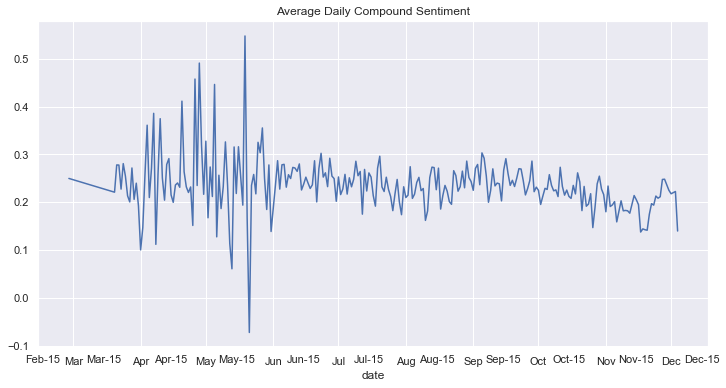

In [34]:
fig, ax = plt.subplots(figsize=(12,6))

sns.lineplot(x=df_daily_avg_sentiment.index,y=df_daily_avg_sentiment.values)

# x-axis limits, for date:
# ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 6, 1))

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

plt.title('Average Daily Compound Sentiment')
plt.show();

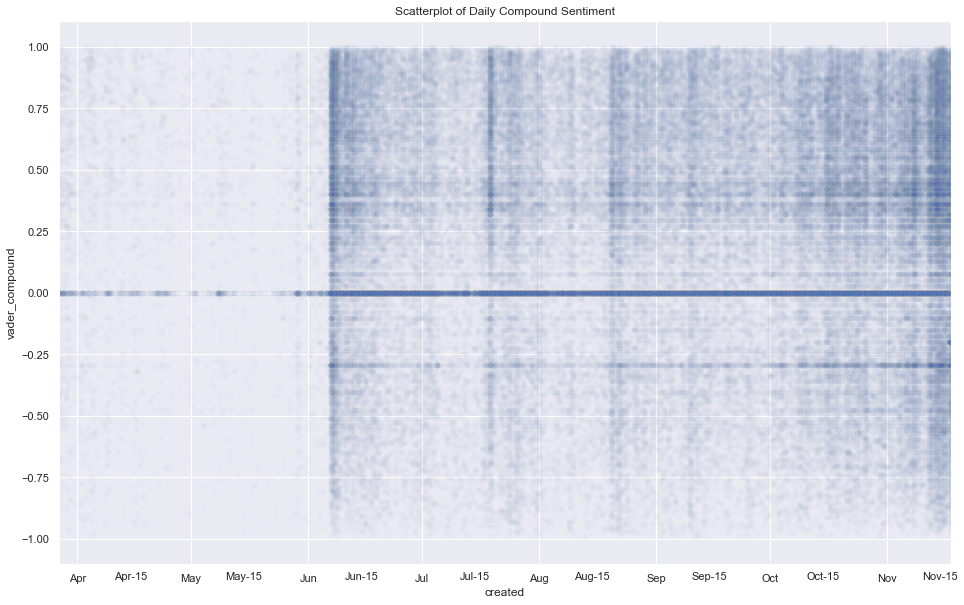

In [35]:
fig, ax = plt.subplots(figsize=(16,10))

sns.scatterplot(y=df_discuss.vader_compound, x=df_discuss.created, alpha=0.02)

# # x-axis limits, for date:
ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

plt.title('Scatterplot of Daily Compound Sentiment')
plt.show();

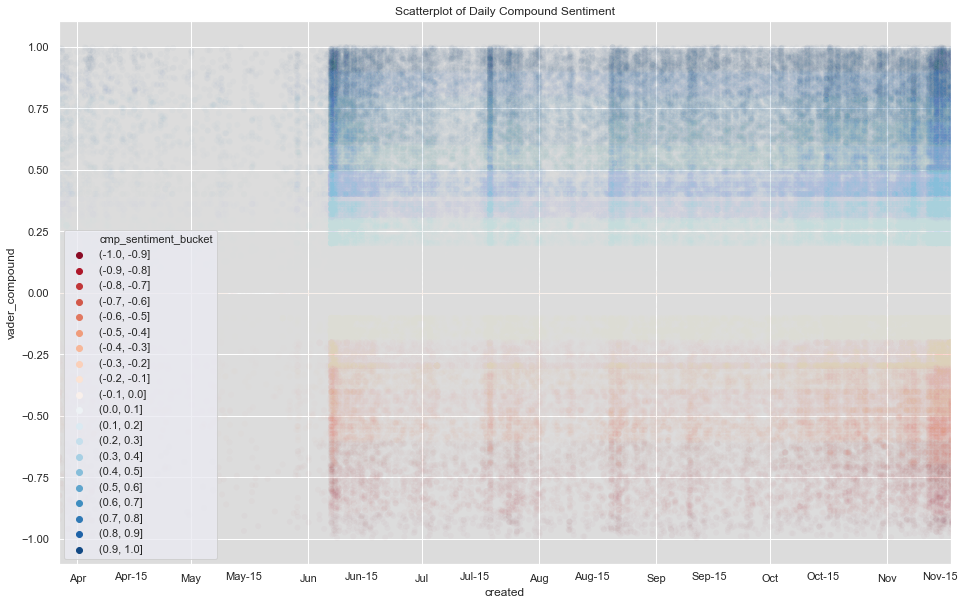

In [280]:
fig, ax = plt.subplots(figsize=(16,10))

sns.scatterplot(
    y=df_discuss.vader_compound, x=df_discuss.created,
    hue=df_discuss.cmp_sentiment_bucket, palette=sns.color_palette("RdBu", n_colors=20),
    alpha=0.02
)

# darker background is better for this color-dependent scatter-plot
ax.set_facecolor('gainsboro')


# # x-axis limits, for date:
ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

plt.title('Scatterplot of Daily Compound Sentiment')
plt.show();

In [244]:
print(df_discuss.user_post_quantity_tier.unique())
print(df_discuss.columns)

array(['2-4', '256-512', '16-32', '64-128', '32-64', '128-256',
       '512-1024', '1024-2048', '2048-4096 smita16', '1-2',
       '4096-8192 la2eee', '4-8', '8-16', '16384-32768 None',
       '2048-4096 tekcomms', '2048-4096 bartturner',
       '2048-4096 Mattias1099', '8192-16384 Skeeter1020',
       '2048-4096 PlayerNameT', '2048-4096 Gerolux'], dtype=object)

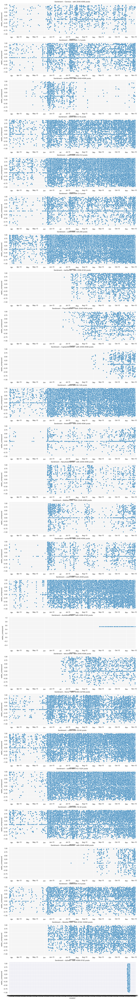

In [38]:
# Plot scatterplots of user sentiment for various user classes:

# user_filter = ['1-2', '2-4', '4-8', '16384-32768 None']
user_filter = []

valid_users = set(df_discuss.user_post_quantity_tier.unique()) - set(user_filter)

n_plots = len(valid_users)

plt.subplots(nrows=n_plots, ncols=1, sharex='all', figsize=(15,120))

color_wheel = sns.color_palette("Paired")

color_wheel.extend(sns.color_palette("Paired"))

for i, user_class in enumerate(list(valid_users)):
    
    plt.subplot(n_plots, 1, i+1)
    
    
    filt = df_discuss.user_post_quantity_tier==user_class
    
    sns.scatterplot(
        y=df_discuss[filt].vader_compound, x=df_discuss[filt].created,
        c=[color_wheel[1]], data=df_discuss[filt]
    )

    # darker background is better for this color-dependent scatter-plot
    ax.set_facecolor('whitesmoke')


    # # x-axis limits, for date:
    ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

    plt.title('Sentiment – ' + str(user_class))

plt.show();

In [39]:
df_discuss['week_of_year'] = df_discuss.date

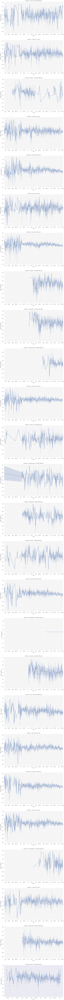

In [40]:
# error-width plots of user sentiment over time

# user_filter = ['1-2', '2-4', '4-8', '16384-32768 None']
user_filter = []

valid_users = set(df_discuss.user_post_quantity_tier.unique()) - set(user_filter)

n_plots = len(valid_users)

fig, ax = plt.subplots(figsize=(15,n_plots*10), sharey=True)

for i, user_class in enumerate(list(valid_users)):
    
    filt = df_discuss.user_post_quantity_tier == user_class
    
    plt.subplot(n_plots, 1, i+1)
    
    sns.lineplot(x='date', y='vader_compound',
#                  hue='user_post_quantity_tier',
                 data=df_discuss[filt]
    )

    # darker background is better for this color-dependent scatter-plot
    ax.set_facecolor('whitesmoke')

    # # x-axis limits, for date:
    ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

    plt.title('Sentiment – ' + str(user_class))

plt.show();

In [ ]:
# Plot scatterplots of user sentiment for various user classes:

user_filter = ['1-2', '2-4', '4-8', '16384-32768 None']

valid_users = set(df_discuss.user_post_quantity_tier.unique()) - set(user_filter)

n_plots = len(valid_users)

plt.subplots(nrows=n_plots, ncols=1, figsize=(15,10))

for i, user_class in enumerate(list(valid_users)):
    
    plt.subplot(n_plots, 1, i+1)
    
    sns.scatterplot(
        y=df_discuss.vader_compound, x=df_discuss.created,
        hue=df_discuss[df_discuss.user_post_quantity_tier.isin(user_filter)].user_post_quantity_tier,
        alpha=0.3
    )

    # darker background is better for this color-dependent scatter-plot
    ax.set_facecolor('gainsboro')


    # # x-axis limits, for date:
    ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
    ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

    plt.title('Sentiment –' + str())

plt.show();

## User Sentiment 

In [44]:
# Aggregate the sum total 'very negative' contributions per user
user_neg_agg_sentiments = df_discuss[df_discuss.vader_compound < -0.8].groupby('author').agg(
    {'vader_compound': ['min','max', 'mean', 'sum']}
)

In [ ]:
# Aggregate the sum total 'very positive' contributions per user
user_pos_agg_sentiments = df_discuss[df_discuss.vader_compound > 0.8].groupby('author').agg(
    {'vader_compound': ['min','max', 'mean', 'sum']}
)
user_pos_agg_sentiments

In [ ]:
# Collect and quantify the sum polarized (very negative or positive) sentiment contributions per user
user_polarized_agg_sentiments = df_discuss.groupby('author').agg(
    {'vader_compound': ['min','max', 'mean', 'sum']}
)

In [ ]:
# Collect and quantify the sum polarized (very negative or positive) sentiment contributions per user
user_polarized_agg_sentiments = df_discuss.groupby('author').agg(
    {'vader_compound': ['min','max', 'mean', 'sum']}
)

In [43]:
user_mean_sentiments

vader_compound                         
                             min     max     mean     sum
author                                                   
---KC---                  0.0000  0.4215  0.21075  0.4215
--Paul--                  0.1179  0.8779  0.59058  2.9529
--__-_-_-_-_-__--        -0.9879 -0.9879 -0.98790 -0.9879
-Aqeel-                   0.0387  0.9417  0.49020  0.9804
-AvaRISE-                 0.7425  0.7425  0.74250  0.7425
...                          ...     ...      ...     ...
zunitedbols              -0.5994 -0.5994 -0.59940 -0.5994
zurktheman                0.8932  0.8932  0.89320  0.8932
zxlotusxz                 0.1635  0.1635  0.16350  0.1635
zydecb                   -0.4023  0.8020  0.20195  4.4429
zyzz193                  -0.5106  0.8260  0.14697  1.4697

[14093 rows x 4 columns]

In [ ]:
# Sum total sentiment contributions 

## Identify Users by Sentiment Subset

Can we begin by identifying "positive" users?

# Topic Modeling MVP

## Pull from Mongo

In [16]:
# Set up filter for database query
db_filter = [
    {'$match': {'$and': [
        {'score' : {'$gt': 4}}
    ]}
    },
#     {'$limit': 1000}
]

# Just the posts, for now
db_projection = ([
    {'$project': {'_id': 0,  'created_utc':1, 'author':1,
                  'title':1, 'selftext':1, 'id':1, 'permalink':1,
                  'comments': {'author':1, 'score':1, 'created_utc': 1, 'body': 1, 'permalink': 1}
                 }}
])

filter_and_projection = []
filter_and_projection.extend(db_filter)
filter_and_projection.extend(db_projection)

# Pull threads to list
threads = list(collection.aggregate(filter_and_projection))
len(threads)

6854

## Flatten Threads and Lemmatize

In [17]:
# Gather corpora into array of untokenized documents

corpora = []
for thread in threads:
    
    doc = ({'id': thread['id'],
            'created_utc': thread['created_utc'],
            'title': thread['title'],
            'text': thread['title'] + " ... " + thread['selftext'],
            'author': thread['author'],
            'class': 'post',
            'permalink': thread['permalink']
           })
    if len(doc['text']) > 10000:
        continue
    else:
        corpora.append(doc)
    
    for comment in thread['comments']:
        doc = ({'id': thread['id'],
            'created_utc': comment['created_utc'],
            'title': thread['title'],
            'text': comment['body'],
            'author': comment['author'],
            'score': comment['score'],
            'class': 'comment',
            'permalink': comment['permalink']
           })
        if len(doc['text']) > 10000 or doc['score'] < 4:
            continue
        else:
            corpora.append(doc)
len(corpora)

40485

In [18]:
df = pd.DataFrame.from_dict(corpora)
df['created_ts'] = pd.to_datetime(df['created_utc'], unit='s')
df.permalink = "<a href='https://www.reddit.com" + df.permalink + "'>Thread</a>"
df.dtypes

id                     object
created_utc           float64
title                  object
text                   object
author                 object
class                  object
permalink              object
score                 float64
created_ts     datetime64[ns]
dtype: object

In [19]:
df.sample(5)

,id,created_utc,title,text,author,class,permalink,score,created_ts
19399,chmm4l,1.564055e+09,Making a move! - act 2,Making a move! - act 2 ... Hello friends!\n\nI...,ITGuy_Gaming,post,<a href='https://www.reddit.com/r/Stadia/comme...,NaN,2019-07-25 11:46:40
16650,bxgcbd,1.559827e+09,"Details just leaked, launch in November in 13 ...",1080P not requiring a subscription is pretty nice,smiller171,comment,<a href='https://www.reddit.com/r/Stadia/comme...,8.0,2019-06-06 13:20:44
29060,e03d7m,1.574440e+09,Game prices in Sweden are insane,Game prices in Sweden are insane ... Stadia wo...,Null-Syntax,post,<a href='https://www.reddit.com/r/Stadia/comme...,NaN,2019-11-22 16:32:45
9669,d8cmnx,1.569290e+09,So Greg from Kinda Funny just recorded a podca...,The one in the back is black. The midnight blu...,blaydesm,comment,<a href='https://www.reddit.com/r/Stadia/comme...,6.0,2019-09-24 02:00:45
24952,e4kn1h,1.575222e+09,I am Getting More and More Convinced,The biggest breakthrough is when Uplay will be...,Sanatori2050,comment,<a href='https://www.reddit.com/r/Stadia/comme...,7.0,2019-12-01 17:46:10


In [20]:
allowed_pos = ['NOUN', 'VERB','ADV','ADJ', 'SYM']

allow_noun_chunks=True

def lemmatize_via_spacy(doc, pos=allowed_pos, tokenizer=spacy_nlp, noun_chunks=allow_noun_chunks):
    '''
    
    Lemmatize a document using the spacy_nlp `en_core_web_sm` tokenizer.
    
    Ignores words with part of speech outside `allowed_pos`.
    
    spacy_nlp = spacy.load("en_core_web_sm")
    
    Returns a list of tuples with lemma and part of speech.
    e.g (token.lemma_, token.pos_)
    
    '''
    
    tokenized_doc = tokenizer(doc)
    
    lemmas = [(token.lemma_, token.pos_) for token in tokenized_doc 
     if (token.pos_ in allowed_pos and token.lemma_ != '-PRON-')]
    
    if noun_chunks:
        for noun_chunk in tokenized_doc.noun_chunks:
            nc = (noun_chunk.text.lower(), 'NOUN_CHUNK')
            lemmas.append(nc)

#     noun_chunks = [chunk.text for chunk in tokenized_doc.noun_chunks]
    
    return lemmas

In [ ]:
model.fit_and_return_top_topics([''])

In [21]:
df.columns

Index(['id', 'created_utc', 'title', 'text', 'author', 'class', 'permalink',
       'score', 'created_ts'],
      dtype='object')

In [23]:
raw_texts = df.text.values
len(raw_texts)

40485

In [24]:
lemmatized_corpora = [lemmatize_via_spacy(raw_text) for raw_text in raw_texts]

In [25]:
# Lemmatize
df['lemmatized'] = pd.Series(lemmatized_corpora)

In [27]:
vader_compound = [vader_compound_polarity(raw_text) for raw_text in raw_texts]

In [28]:
# Vader Compoundac
df['vader_compound'] = vader_compound

In [29]:
import pickle

In [30]:
with open('./data/stadia_df_pickle.pkl', 'wb') as file:
    pickle.dump(df, file)

In [405]:
df.vader_compound.describe()

count    21954.000000
mean         0.243402
std          0.471665
min         -0.995400
25%          0.000000
50%          0.261700
75%          0.646800
max          0.999700
Name: vader_compound, dtype: float64

## Topic Modeling (NMF)

In [266]:
# Topic Modeling Setup
swds_gaming = ([
    'game','gaming', 'everyone','amount', 'lot', 'guy', 'bit' ,'anyone' ,'thing', 'one', 'rdr2','gamer',
])

# Define Stop Words
swds = custom_stop_words([
    swds_reddit_and_web,
    swds_gaming
], stop_english=True)

# Set allowed parts of speech:
allowed_pos = ([
    'ADJ',
    'NOUN',
    'VERB',
    'ADV',
    'PROPN',
    'SYM',
    'X'
])

# Helper Functions for Vectorizer

# Define Tokenizer Rules
def select_token(doc):
    try:
        return ([token[0] for token in doc
                 if (token[0] not in swds
                     and token[1] in allowed_pos and len(token[0]) > 1)])
    except:
        print("error selecting tokens of this doc", doc)
        return [doc]
        
def dummy(doc):
    return doc

# Define Vectorizer
vectorizer = TfidfVectorizer(tokenizer=select_token, stop_words=swds,
                             max_df=0.3, min_df=100,  # token thresholds
                             preprocessor=dummy,
                             lowercase=False)

# Initialize and set unique Model ID
model = Custom_NMF(n_components=20)


Model Name: SubRel-TM-Pygmalion-Jacqueline–1575570280


In [ ]:
# Run model, and save top topics as column of main dataframe
df['main_topic'], df['main_topic_weight'], df['secondary_topic'], doc_mean_topic_pcts = (
    model.fit_and_return_top_topics(
        df.lemmatized.values, vectorizer, verbose=False)
)

# Save Model ID to Dataframe
df['Model_ID'] = model.id

In [304]:
# # sorted by mean salience
# topic_saliences = sorted(list(zip(list(range(30)), doc_mean_topic_pcts)), key=lambda x: x[1], reverse=True)

# sorted by topic index (for labeling)
topic_saliences = list(zip(list(df.main_topic.unique()), doc_mean_topic_pcts))


for (topic, salience) in sorted(topic_saliences):
    value = model.topic_dict[topic]
    try:
        topic_name = topic_names[topic]
    except:
        topic_name = topic
    value_count = value["value_count"]
    sal = doc_mean_topic_pcts[topic]
    print(f'Topic #{topic} - [ {topic_names[topic]} ] – {value_count} docs\nmean_salience = {round(sal, 5)}\n')
    print('  '.join([pair[0] for pair in value['top_words'][:50]]))
    print('\n–––––')

Topic #0 - [ Connectivity, Latency, Streaming ] – 8080 docs
mean_salience = 0.00799

work  make  run  time  need  even  pc  also  console  latency  try  could  issue  take  stream  video  platform  well  year  great  sure  much  lag  hardware  internet  experience  may  new  streaming  still  connection  service  seem  way  server  input  high  mean  quality  feel  big  developer  right  setting  point  problem  cloud  support  something  test

–––––
Topic #1 - [ Anxiety over Product Delivery ] – 1817 docs
mean_salience = 0.00706

get  code  name  email  hope  try  finally  today  founder  back  let  hour  keep  pass  charge  buddy  pay  maybe  else  way  username  soon  shit  hand  excited  chance  never  early  first  hop  mean  someone  kid  love  edition  could  wonder  access  remove  week  even  take  help  worth  set  destiny  start  away  refund  wrong

–––––
Topic #2 - [ Community Oriented ] – 2140 docs
mean_salience = 0.00694

play  able  pc  hour  tv  cross  time  destiny  p

In [ ]:
# defect-Texaco

# Manually Name Topics
topic_names = {
    0: 'Subscription Model Pros/Cons',
    1: 'Public Perception of Launch',
    2: 'Discussion of Hardware',
    3: 'Launch Day Delivery Issues',
    4: 'Comparison to Other Consoles',
    5: '???',
    6: 'Launch Day Delivery Issues',
    7: 'Comparison to PC Gaming',
    8: 'Jealousy, Compersion',
    9: 'Unicorns (Singles courted by couples)',
    10: 'Sexual Orientation, Gender, Sex',
    11: 'Mental Health, Breakups',
    12: 'Sexual Health, STIs',
    13: 'Representation in Media and Culture',
    14: 'Comparing Monogamy vs Non-Monogamy',
    15: 'Weddings',
    16: 'Parenting while Polyamorous, Co-parenting',
    17: 'Infidelity, Dishonesty',
    18: 'Marriage, Legal Challenges to Polyamory, Custody',
    19: 'Metamours: Partners of Partners',
    20: 'T 20',
    21: 'T 21',
    22: 'T 22',
    23: 'T 23',
    24: 'T 24',
    25: 'T 25',
    26: 'T 26',
    27: 'T 27',
    28: 'T 28',
    29: 'T 29',
}

model.topic_output['Topic_Alias'] = (
    model.topic_output.main_topic
    .apply(lambda x: topic_names[x])
)

In [270]:
# SubRel-TM-trestle-airway–1575496112

# Manually Name Topics
topic_names = {
    0: 'Connectivity, Latency, Streaming',
    1: 'Product Delivery',
    2: 'Community Oriented',
    3: 'Anxiety over Product Delivery',
    4: "Questions about Hardware",
    5: "Feature Request",
    6: "Polarized User Experience",
    7: "Competitor Comparison",
    8: '---',
    9: 'Public Perception of Launch',
    10: '---',
    11: 'Internet Connectivity, Streaming Concerns',
    12: 'Launch Day Hype',
    13: 'General Positive Hype',
    14: '---',
    15: '???',
    16: 'Potential Negativity',
    17: 'Concerns over Subscription Model',
    18: 'Direct Call for Company Feedback',
    19: 'Excitement over Product Launch'
}

model.topic_output['Topic_Alias'] = (
    model.topic_output.main_topic
    .apply(lambda x: topic_names[x])
)

In [ ]:
vectorizer

In [ ]:
model.model.transform()

In [271]:
df.columns

Index(['id', 'created_utc', 'title', 'text', 'author', 'class', 'permalink',
       'score', 'created_ts', 'lemmatized', 'vader_compound', 'main_topic',
       'main_topic_weight', 'secondary_topic', 'Model_ID', 'day_of_year',
       'month_of_year', 'month'],
      dtype='object')

In [273]:
df['Topic Alias'] = df.main_topic.apply(lambda x: topic_names[x])

In [ ]:
model.model.

In [ ]:
with open('./data/stadia_topics_final')

In [572]:
# Anchor words
anchor_words = ([
    # The device specifics
    ['controller', 'phone', 'chromecast', 'device'],
    
    # Connectivity and Internet Access Issues:
    ['lag', 'wifi', 'internet'],
    
    # 
    ['game', 'platform', 'developer', 'new'],
    
    # Discussing the role of a subscription service
    ['subscription','exclusive','access','digital'],
    
    # Discussing the launch
    ['launch','preorder', 'release'],
    
    # Discussing the beta
    ['beta','release']
    
#     ['sports', 'stadium'],
])

In [414]:
df.columns

Index(['id', 'created_utc', 'title', 'text', 'author', 'class', 'permalink',
       'score', 'created_ts', 'lemmatized', 'vader_compound', 'main_topic',
       'main_topic_weight', 'secondary_topic', 'Model_ID'],
      dtype='object')

In [40]:
# view thread columns
inspect_cols = ['created_ts', 'class', 'text', 'permalink', 'main_topic','main_topic_weight', 'vader_compound']

In [250]:
# view top documents of each class
(HTML(df[df.main_topic == 9].sort_values(by='main_topic_weight', ascending=[False])[inspect_cols]
     .head(200).sample(10).to_html(index=False, escape=False)))

created_ts,class,text,permalink,main_topic,main_topic_weight,vader_compound
2019-11-19 20:57:11,post,"Stadiacast live streaming Destiny 2 now ... Title says it all, check it out",Thread,9,0.680978,0.0000
2019-11-18 18:14:41,comment,Weird you say painful but digital foundry and other reviews have been fairly positive.,Thread,9,0.787161,0.5574
2019-08-25 10:08:06,comment,He literally said desktop for 2000,Thread,9,0.874589,0.0000
2019-09-15 07:42:54,comment,Says the guy who will die alone and never had some woman he never paided for,Thread,9,0.715937,-0.7096
2019-10-19 00:06:46,comment,"Just so we're all clear, you are saying that almost everything in this video on the Google Stadia YouTube channel is lies?\n\nhttps://youtu.be/Pwb6d2wK3Qw",Thread,9,0.708152,0.0164
2019-11-18 21:28:55,comment,"Because they lied\*\n\n​\n\n\*Technically in the tiny fine-print on the site they said you'll be playing up to 4k, but their entire messaging has been 4k/60fps and in reality it's not, so what can they say? Whoops, Sorry.",Thread,9,0.695664,-0.0129
2019-11-20 02:04:01,comment,"Say hi to customer service team, they are the worst.",Thread,9,0.681233,-0.6249
2019-11-28 18:51:49,comment,You couldn't have said that better. This exactly!,Thread,9,0.786707,0.4926
2019-10-22 20:17:48,comment,This article says couch co-op.\n\nhttps://www.engadget.com/2019/06/12/darksiders-genesis-e3-demo/?guccounter=1&guce_referrer=aHR0cHM6Ly93d3cuZ29vZ2xlLmNvbS8&guce_referrer_sig=AQAAAAI4Pw90JtCuzfz7a1nTaPJtNPlJOuL9nHz-xe_Yaa3rZ4dlQsbqNuWcipdr0JmQpDJyjsTsZg89GlklhrWRaS9BgpdLRU-Gvc942tsx-Z8D8v25O10yh0h68DRC-W28AbsqFzZSpS7fsBdzDolj3D8oLofufj3ZhYIhV4b8mX_I,Thread,9,0.956690,0.0000
2019-10-26 09:43:07,comment,This support guy has no idea what he's saying.,Thread,9,0.704826,0.1280


In [569]:
# view top documents of each class
(HTML(df[df.main_topic == 1].sort_values(by='main_topic_weight', ascending=False)[inspect_cols]
     .head(4).to_html(index=False, escape=False)))

created_ts,class,text,permalink,main_topic,main_topic_weight,vader_compound
2019-06-30 16:03:40,comment,Why are you here? Just to piss in other people's milk?,Thread,1,1.0,-0.4696
2019-11-06 10:03:16,comment,Suspect the complaining would be more from people that do not have Stadia. Like the complaining around the Pixel 4.,Thread,1,1.0,-0.7105
2019-09-04 10:56:59,comment,Because LinkedIn is basically Facebook for people who think they are CEOs,Thread,1,1.0,0.0000
2019-09-03 18:24:42,comment,"Let's keep it about Rampart, people...",Thread,1,1.0,0.0000


In [570]:
HTML(df[inspect_cols][df.main_topic == 3].head().to_html(escape=False))

,created_ts,class,text,permalink,main_topic,main_topic_weight,vader_compound
25,2019-11-18 03:38:11,comment,"That's killer! I'm excited to try out samurai showdown. I keep hearing good things about gylt too, so I may have to try that. We'll see, I'm not a huge horror game fan.",Thread,3,0.519759,0.5615
49,2019-11-18 05:21:32,comment,I'm curious to see if RDR2 will run smoother and/or better than on PC.,Thread,3,0.537104,0.6369
61,2019-11-18 13:01:01,comment,"Personally I just don't like these kinda posts, but that's just me and I know you're only kidding. I'm using Stadia while I save up for better hardware for my PC as it's getting on a bit now, but hey, I'm still pretty stoked for the coming week.",Thread,3,0.463495,0.9259
84,2019-11-18 02:50:15,comment,"I'll probably buy the best game that's around $20, not gunna go overboard since I'm pretty invested in the new pokemon game atm.",Thread,3,0.488943,0.8126
143,2019-11-18 02:29:26,comment,It feels good to be a Founder.,Thread,3,1.000000,0.4404


In [317]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

Text(0.5, 1.0, 'Sentiment Analysis Across Brand Specific Topics')

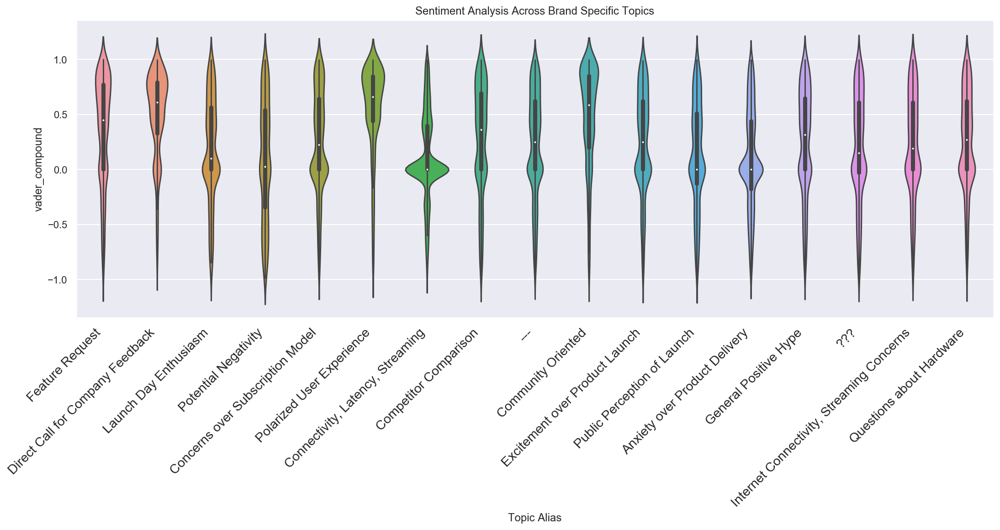

In [319]:
fig, ax = plt.subplots(figsize=(18,6))
chart = sns.violinplot(data=df[df.main_topic < 20], x='Topic Alias', y='vader_compound', )
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large'  
)
plt.title("Sentiment Analysis Across Brand Specific Topics")

ValueError: min() arg is an empty sequence

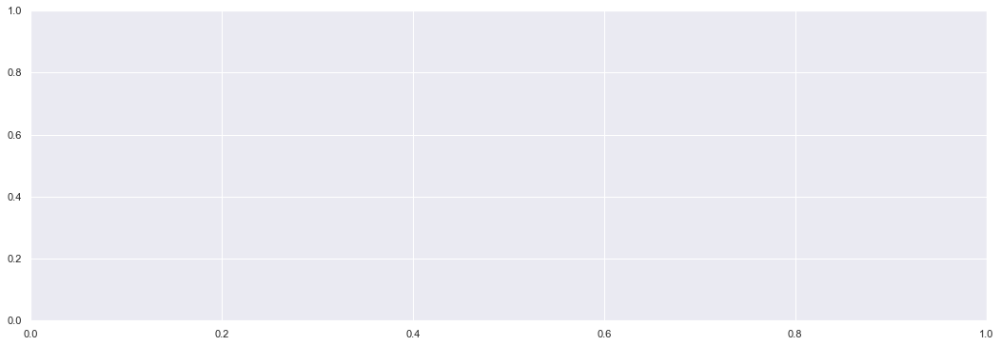

In [88]:
fig, ax = plt.subplots(figsize=(18,6))
sns.violinplot(data=df[df.main_topic >= 15], x='main_topic', y='vader_compound')

## Plotting Topic Growth Over Time

In [57]:
df['day_of_year'] = df['created_ts'].apply(lambda x: x.date())
df['month_of_year'] = df['created_ts'].apply(lambda x: x.month)
df.dtypes

id                           object
created_utc                 float64
title                        object
text                         object
author                       object
class                        object
permalink                    object
score                       float64
created_ts           datetime64[ns]
lemmatized                   object
vader_compound              float64
main_topic                    int64
main_topic_weight           float64
secondary_topic               int64
Model_ID                     object
day_of_year                  object
month_of_year                 int64
dtype: object

In [225]:
df.created_ts.sample(1).values

array(['2019-11-30T04:49:19.000000000'], dtype='datetime64[ns]')

In [283]:


# Calculate Time Period Information
# df['year'] = df['created_ts'].dt.dayofyear
df['month'] = df['created_ts'].dt.strftime('%b-%Y')
df['date'] = df['created_ts'].dt.date

# Formulate Day by Day Totals for Each Topic
gb = df.groupby(by=['month', 'Topic Alias'])
df_topics_by_day = pd.DataFrame(gb['created_ts'].count()).reset_index()
df_topics_by_day.columns = ['month','Topic Alias', 'threads']

print(df_topics_by_day.head())

df_topics_by_day['Model_ID'] = model.id
df_topics_by_day['Percent of threads in month'] = df_topics_by_day.threads / df_topics_by_day.groupby('month')['threads'].transform('sum')
df_topics_by_day.head()

      month                    Topic Alias  threads
0  Apr-2019                            ---       26
1  Apr-2019                            ???        7
2  Apr-2019  Anxiety over Product Delivery        9
3  Apr-2019             Community Oriented       10
4  Apr-2019          Competitor Comparison       14


,month,Topic Alias,threads,Model_ID,Percent of threads in month
0,Apr-2019,---,26,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.105263
1,Apr-2019,???,7,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.028340
2,Apr-2019,Anxiety over Product Delivery,9,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.036437
3,Apr-2019,Community Oriented,10,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.040486
4,Apr-2019,Competitor Comparison,14,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.056680


In [ ]:
start_date = dt.date(2019, 5, 1)
end_date = dt.date(2019, 8, 1)

time_filter = df.created_ts > 

In [280]:
df_topics_by_day

,month,Topic Alias,threads,Model_ID,Percent of threads in year
0,Apr-2019,---,26,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.105263
1,Apr-2019,???,7,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.028340
2,Apr-2019,Anxiety over Product Delivery,9,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.036437
3,Apr-2019,Community Oriented,10,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.040486
4,Apr-2019,Competitor Comparison,14,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.056680
...,...,...,...,...,...
165,Sep-2019,Launch Day Enthusiasm,113,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.044331
166,Sep-2019,Polarized User Experience,116,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.045508
167,Sep-2019,Potential Negativity,136,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.053354
168,Sep-2019,Public Perception of Launch,77,SubRel-TM-Pygmalion-Jacqueline–1575570280,0.030208


(0, 1)

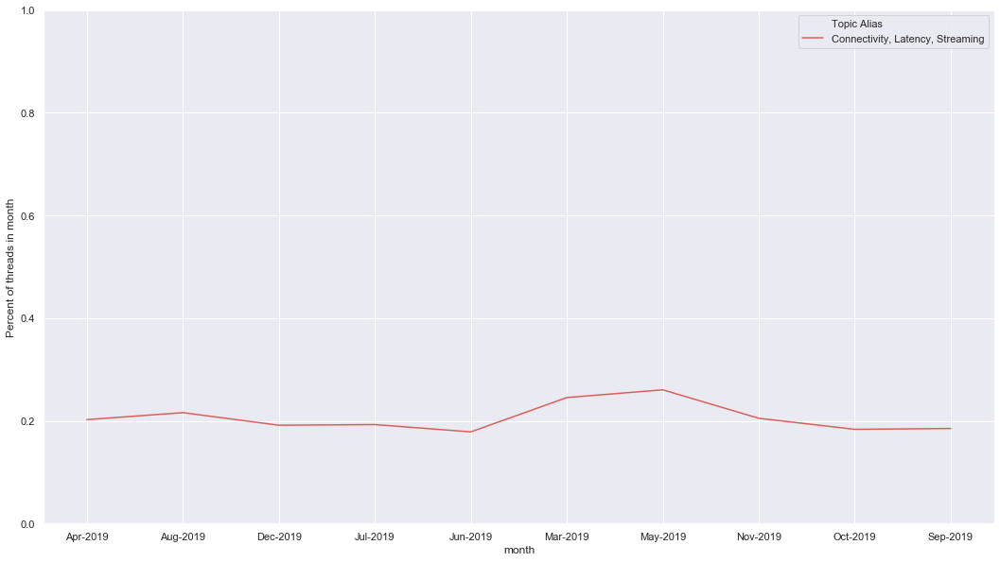

In [312]:
fig, ax = plt.subplots(figsize = (18, 10))

filt = (df_topics_by_day['Topic Alias'] == "Connectivity, Latency, Streaming")
data = df_topics_by_day[filt]
                        
color_count = data['Topic Alias'].nunique()

sns.lineplot(data=data, x="month", y="Percent of threads in month", hue="Topic Alias", legend='full',
             palette=sns.color_palette("hls", color_count))

ax.set_ylim(0, 1)

(0, 1)

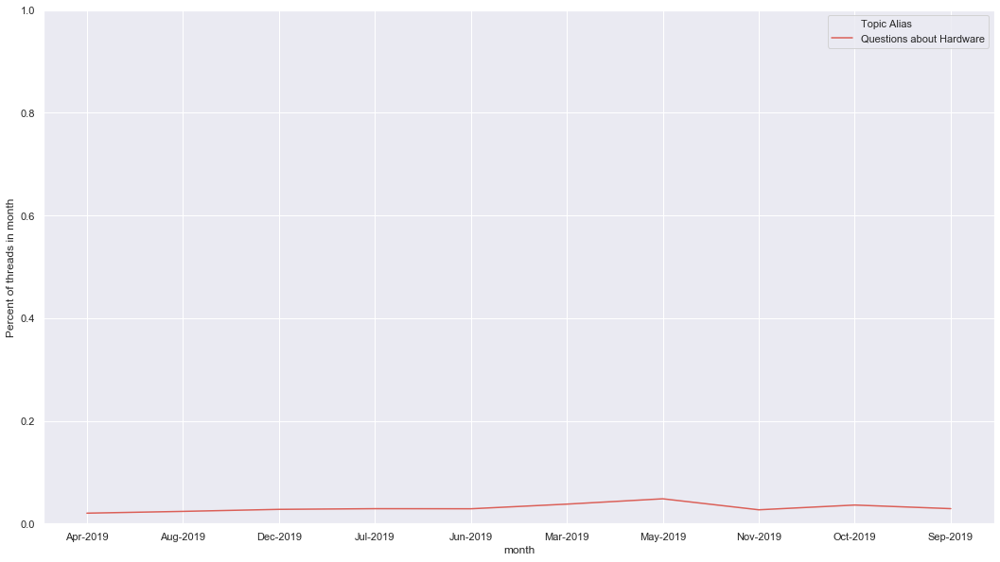

In [314]:
fig, ax = plt.subplots(figsize = (18, 10))

filt = (df_topics_by_day['Topic Alias'] == "Questions about Hardware")
data = df_topics_by_day[filt]
                        
color_count = data['Topic Alias'].nunique()

sns.lineplot(data=data, x="month", y="Percent of threads in month", hue="Topic Alias", legend='full',
             palette=sns.color_palette("hls", color_count))
ax.set_ylim(0, 1)

(0, 1)

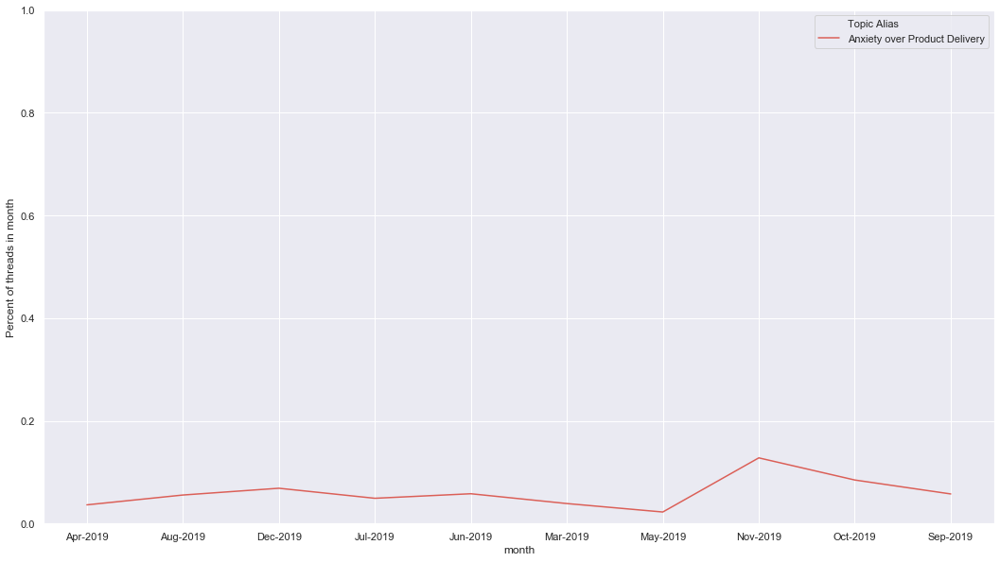

In [315]:
fig, ax = plt.subplots(figsize = (18, 10))

filt = (df_topics_by_day['Topic Alias'] == "Anxiety over Product Delivery")
data = df_topics_by_day[filt]
                        
color_count = data['Topic Alias'].nunique()

sns.lineplot(data=data, x="month", y="Percent of threads in month", hue="Topic Alias", legend='full',
             palette=sns.color_palette("hls", color_count))
ax.set_ylim(0, 1)

(0, 1)

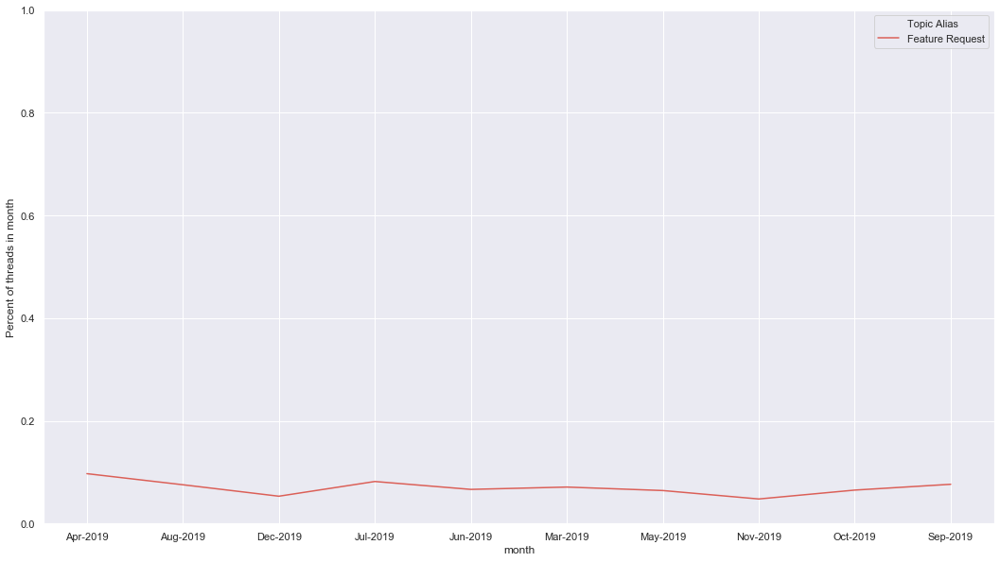

In [316]:
fig, ax = plt.subplots(figsize = (18, 10))

filt = (df_topics_by_day['Topic Alias'] == "Feature Request")
data = df_topics_by_day[filt]
                        
color_count = data['Topic Alias'].nunique()

sns.lineplot(data=data, x="month", y="Percent of threads in month", hue="Topic Alias", legend='full',
             palette=sns.color_palette("hls", color_count))
ax.set_ylim(0, 1)

Text(0.5, 1.0, 'Potentially Negative Threads')

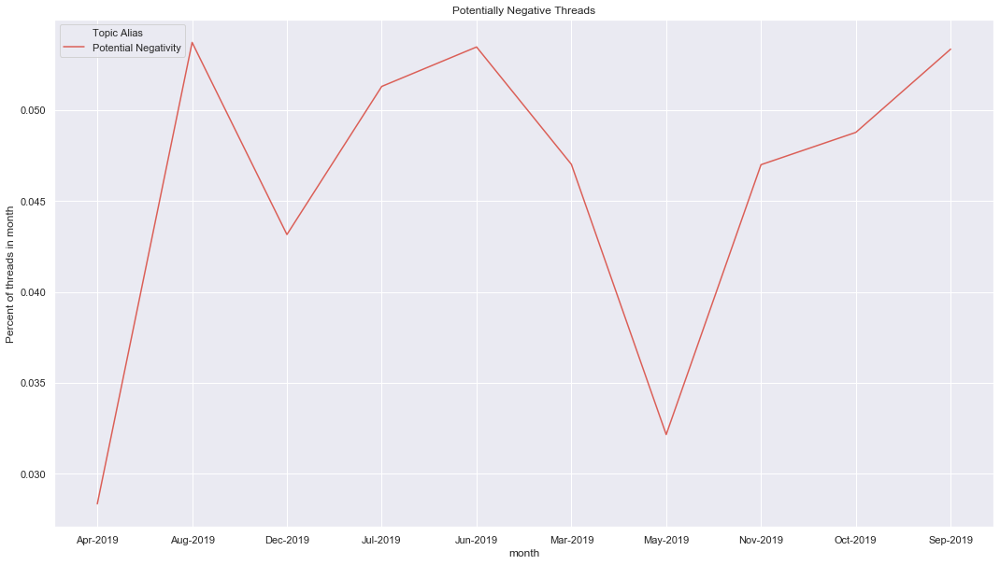

In [310]:
fig, ax = plt.subplots(figsize = (18, 10))

filt = (df_topics_by_day['Topic Alias'] == "Potential Negativity")
data = df_topics_by_day[filt]
                        
color_count = data['Topic Alias'].nunique()

sns.lineplot(data=data, x="month", y="Percent of threads in month", hue="Topic Alias", legend='full',
             palette=sns.color_palette("hls", color_count))
plt.title('Potentially Negative Threads')

In [353]:
df_topics_by_day.columns

Index(['month', 'Topic Alias', 'threads', 'Model_ID',
       'Percent of threads in month'],
      dtype='object')

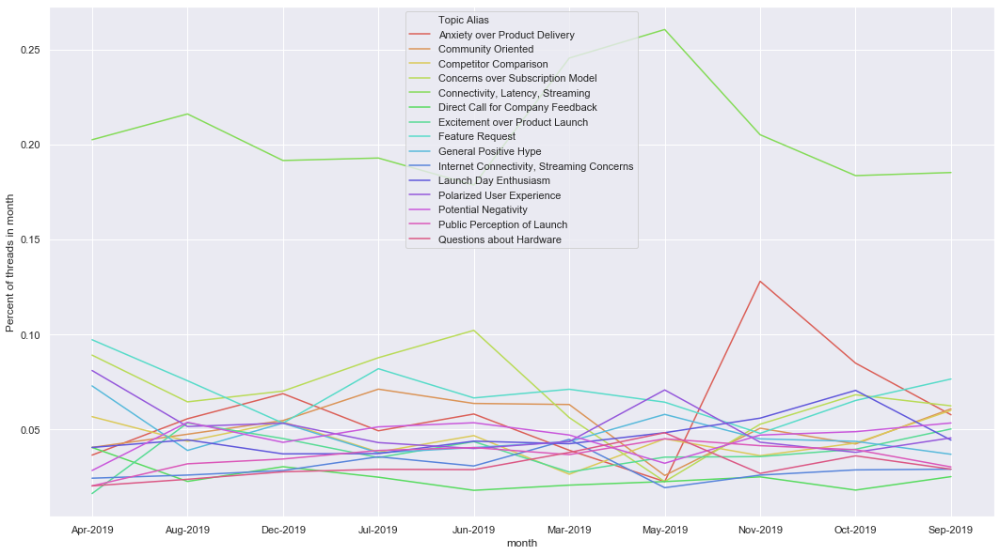

In [297]:
fig, ax = plt.subplots(figsize = (18, 10))

filt = ((df_topics_by_day['Topic Alias'] != '---') &
        (df_topics_by_day['Topic Alias'] != '???') & 
        ()
data = df_topics_by_day[filt]
                        
color_count = data['Topic Alias'].nunique()

sns.lineplot(data=data, x="month", y="Percent of threads in month", hue="Topic Alias", legend='full',
             palette=sns.color_palette("hls", color_count))

In [322]:
unique_topics = df.main_topic.unique()
unique_topics

array([ 5, 18, 12, 16, 17,  6,  0,  7,  8,  2, 19,  9,  1,  3, 13, 14, 10,
       15, 11,  4])

In [350]:
df.columns

Index(['id', 'created_utc', 'title', 'text', 'author', 'class', 'permalink',
       'score', 'created_ts', 'lemmatized', 'vader_compound', 'main_topic',
       'main_topic_weight', 'secondary_topic', 'Model_ID', 'day_of_year',
       'month_of_year', 'month', 'Topic Alias'],
      dtype='object')

In [352]:
df[['id','created_ts', 'created_utc', 'month', 'vader_compound','score','main_topic','author', 'title', 'text','class','permalink','Topic Alias',]].to_csv('./data/stadia_stats.csv')

TypeError: set_style() got an unexpected keyword argument 'fontsize'

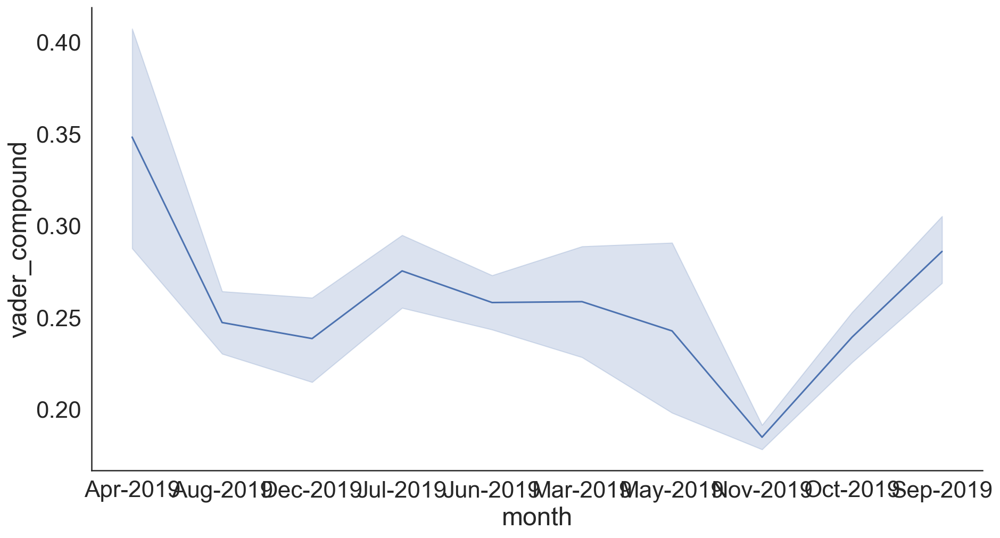

In [349]:
fig, ax = plt.subplots(figsize=(15,8))


sns.despine()
sns.set_style("white")
sns.lineplot(data=df, x="month", y="vader_compound")

sns.set_style(fontsize=2)
ax.set_xlabel("",fontsize=4);
ax.set_ylabel('Sentiment',fontsize=15);

ax.set_title("Global Subreddit Sentiment Leading Up to Launch", fontsize=20)

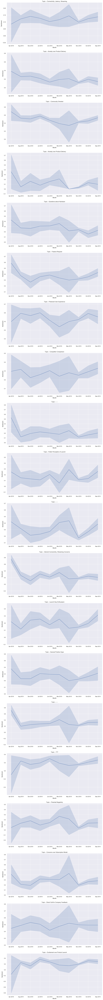

In [330]:
n_plots = len(unique_topics)

fig, ax = plt.subplots(figsize=(15,n_plots*8))

for i, topic_id in enumerate(sorted(unique_topics)):
    
    plt.subplot(n_plots, 1, i+1)
    
    
    filt = (df.main_topic==topic_id)
    
    sns.lineplot(data=df[filt], x="month", y="vader_compound",
    #              units='day_of_year', estimator=None,
                 legend='full')

    # darker background is better for this color-dependent scatter-plot
#     ax.set_facecolor('whitesmoke')

    plt.ylabel("Sentiment")
    plt.xlabel("Month")

#     # # x-axis limits, for date:
#     ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

#     ax = plt.gca()
#     ax.xaxis.set_major_locator(mdates.MonthLocator())
#     ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
#     ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
#     ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

    plt.title('Topic – ' + str(topic_names[topic_id]))

plt.show();

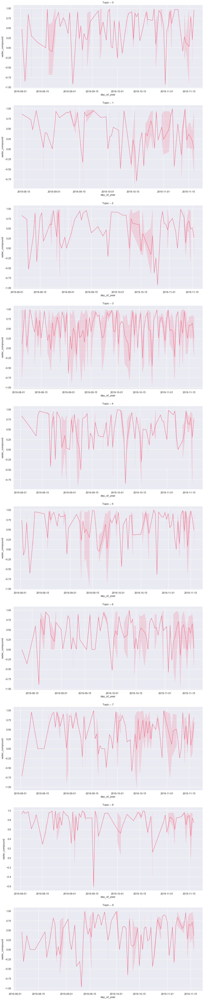

In [383]:
n_plots = len(unique_topics)

fig, ax = plt.subplots(figsize=(15,n_plots*8))

for i, topic_id in enumerate(sorted(unique_topics)):
    
    plt.subplot(n_plots, 1, i+1)
    
    
    filt = (df.main_topic==topic_id) & (df.day_of_year>dt.date(2019, 8, 1))
    
    sns.lineplot(data=df[filt], x="month", y="vader_compound",
    #              units='day_of_year', estimator=None,
                 legend='full')

    # darker background is better for this color-dependent scatter-plot
#     ax.set_facecolor('whitesmoke')


#     # # x-axis limits, for date:
#     ax.set_xlim(left=dt.date(2019, 3, 27), right=dt.date(2019, 11, 18)) 

#     ax = plt.gca()
#     ax.xaxis.set_major_locator(mdates.MonthLocator())
#     ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonthday=15))
#     ax.xaxis.set_major_formatter(mdates.DateFormatter('%b'))
#     ax.xaxis.set_minor_formatter(mdates.DateFormatter('%b-15'))

    plt.title('Topic – ' + str(topic_id))

plt.show();

In [ ]:
# Investigate days that have some kind of interesting topic X sentiment spike:
topic_to_inspect = 9
start_date = dt.date(2019, 8, 1)
end_date = dt.date(2019, 8, 1)
filt = (df.main_topic == topic_to_inspect) & (df.day_of_year>start_date) & (df.day_of_year>end_date)
HTML(df[inspect_cols][].head().to_html(escape=False))

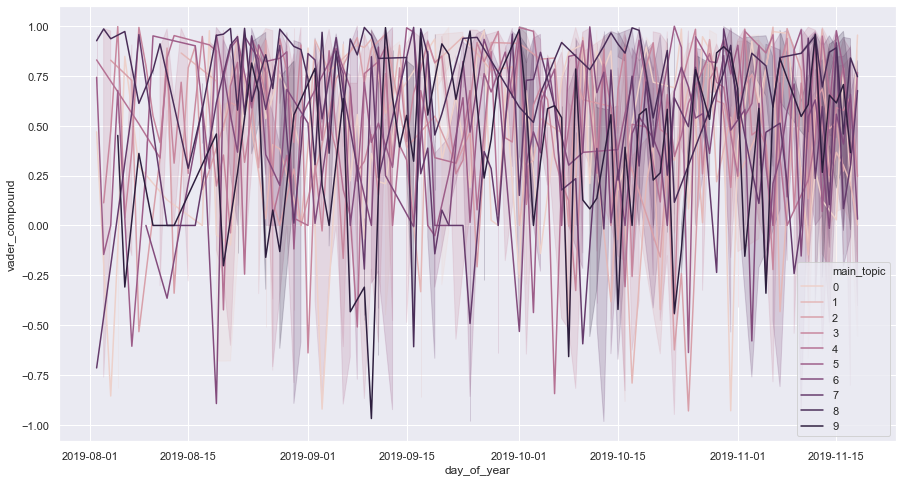

In [364]:
fig, ax = plt.subplots(figsize=(15,8))
sns.set_palette("husl")

sns.lineplot(data=df[df.day_of_year>dt.date(2019, 8, 1)], x="day_of_year", y="vader_compound",
#              units='day_of_year', estimator=None,
             hue="main_topic", legend='full')
plt.show()

In [ ]:
# fig, ax = plt.subplots(figsize=(15,15))
# palette = sns.color_palette("Paired") + sns.color_palette("Paired") 
# sns.lineplot(y='threads',x='day', hue='topic_id', data=pd.merge(
#     df_topics_by_day, model.topic_output['main_topic'], left_on='topic_id', right_on='main_topic'
# ))

In [156]:
df.head()

,author,corpora,raw,main_topic,main_topic_weight,secondary_topic,Model_ID
0,RootAtAnonymous,"[(community, NOUN), (just, ADV), (want, VERB),...","💗 this community ... Just wanted to say, I lov...",1,0.443120,0,SubRel-TM-chocolate-impelling–1575329128
1,smita16,"[(so, ADV), (stupid, ADJ), (do, VERB), (not, A...",So stupid. Kotaku doesn't even research stuff ...,3,0.394975,0,SubRel-TM-chocolate-impelling–1575329128
2,bric12,"[(now, ADV), (have, VERB), (more, ADJ), (launc...",Stadia now has more launch games than the Xbox...,6,0.413184,3,SubRel-TM-chocolate-impelling–1575329128
3,Knightstar76,"[(number, NOUN), (game, NOUN), (launch, NOUN),...",The number of games at launch just doubled! .....,3,0.638302,4,SubRel-TM-chocolate-impelling–1575329128
4,RjHospe,"[(people, NOUN), (that, ADJ), (cancel, VERB), ...",People that cancelled their pre-orders because...,3,0.333317,1,SubRel-TM-chocolate-impelling–1575329128


# CorEx Topic Modeling

In [366]:
import scipy.sparse as ss
import matplotlib.pyplot as plt

from corextopic import corextopic as ct
from corextopic import vis_topic as vt # jupyter notebooks will complain matplotlib is being loaded twice

//anaconda3/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [545]:
swds_reddit_and_web

['reddit',
 'subreddit',
 'posts',
 'commentshtml',
 'com',
 'utm',
 'www',
 'http',
 'https',
 'sub',
 'medium',
 'deleted',
 'delete',
 'removed',
 'x200b',
 'op',
 'r']

In [558]:
df.shape

(21954, 15)

In [553]:
# Topic Modeling Setup
swds_gaming = ([
])

# Define Stop Words
swds = custom_stop_words([
    swds_reddit_and_web
], stop_english=True)

# Set allowed parts of speech:
allowed_pos = ([
    'ADJ',
    'NOUN',
    'VERB',
    'ADV',
    'PROPN',
    'SYM'
])

# Helper Functions for Vectorizer

# Define Tokenizer Rules
def select_token(doc):
    try:
        return ([token[0] for token in doc
                 if (token[0] not in swds
                     and token[1] in allowed_pos and len(token[0]) > 1)])
    except:
        print("error: ", doc)
        return ["empty_token", "empty_token"]
        
def dummy(doc):
    return doc

# Define Vectorizer
vectorizer = TfidfVectorizer(tokenizer=select_token, stop_words=swds, max_features=1000,
                             max_df=0.8, min_df=30,  # token thresholds
                             preprocessor=dummy,
                             lowercase=False)

In [552]:
doc_word[0]

<1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 8 stored elements in Compressed Sparse Row format>

In [554]:
doc_word = vectorizer.fit_transform(df.lemmatized)

error:  what
error:  shan't
error:  until
error:  should've
error:  those
error:  sub
error:  be
error:  http
error:  being
error:  not
error:  herself
error:  will
error:  won't
error:  ourselves
error:  wasn't
error:  weren't
error:  haven
error:  has
error:  how
error:  com
error:  same
error:  each
error:  they
error:  ve
error:  you'd
error:  ours
error:  weren
error:  of
error:  after
error:  commentshtml
error:  was
error:  delete
error:  here
error:  by
error:  about
error:  off
error:  were
error:  myself
error:  while
error:  mightn't
error:  we
error:  don
error:  themselves
error:  from
error:  now
error:  you're
error:  doesn't
error:  yourselves
error:  have
error:  theirs
error:  mustn't
error:  me
error:  which
error:  just
error:  didn't
error:  these
error:  ain
error:  hadn't
error:  aren't
error:  out
error:  nor
error:  subreddit
error:  her
error:  our
error:  yourself
error:  him
error:  wasn
error:  again
error:  into
error:  don't
error:  had
error:  and
error:

//anaconda3/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:300: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['empty_token'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [555]:
doc_word = ss.csr_matrix(doc_word)

In [556]:
doc_word.shape # n_docs x m_words

(21954, 1000)

In [557]:
# Get words that label the columns (needed to extract readable topics and make anchoring easier)
words = list(np.asarray(vectorizer.get_feature_names()))

In [559]:

not_digit_inds = [ind for ind,word in enumerate(words) if not word.isdigit()]
doc_word = doc_word[:,not_digit_inds]
words    = [word for ind,word in enumerate(words) if not word.isdigit()]

doc_word.shape # n_docs x m_words

(21954, 1000)

## Unanchored CorEx

In [560]:
n_topics = 20
# Train the CorEx topic model with n topics
topic_model = ct.Corex(n_hidden=n_topics, words=words, max_iter=500, verbose=False, seed=8)
topic_model.fit(doc_word, words=words);

In [561]:
topic_model.tc

0.014407321109945638

In [ ]:
# Anchor words
anchor_words = ([
    # The device specifics
    ['controller', 'phone', 'chromecast', 'device'],
    
    # Connectivity and Internet Access Issues:
    ['lag', 'wifi', 'internet'],
    
    # 
    ['game', 'platform', 'developer', 'new'],
    
    # Discussing the role of a subscription service
    ['subscription','exclusive','access','digital'],
    
    # Discussing the launch
    ['launch','preorder', 'release'],
    
    # Discussing the beta
    ['beta','release']
    
#     ['sports', 'stadium'],
])

In [562]:
# Print all topics from the CorEx topic model
topics = topic_model.get_topics()
for n,topic in enumerate(topics):
    topic_words,_ = zip(*topic)
    print('{}: '.format(n) + ','.join(topic_words))

0: game,order,console,gaming,ship,latency,date,delivery,cloud,server
1: ass,catch,click,else,fan,feed,hate,head,late,leave
2: finish,perfectly,positive,speak,straight,usb,window
3: address,agree,ahead,apparently,awesome,early,everybody,f2p,fix,item
4: available,bundle,cool,definitely,guarantee,lock,note,reveal,series,slightly
5: count,eye,nobody,regard,update,wired,yet
6: assistant,minute,pass,relate,search,seriously,stupid,sure,write
7: achievement,call,clear,dumb,event,feedback,follow,hear,impression,job
8: actual,anyone,fun,guess,hope,information,pop,response,wrong
9: ago,announcement,damn,e3,hater,like,non,sharing,shit,smart
10: begin,hop,ok,rule,store
11: advertise,question,otherwise,must,launch,know,kid,totally,ios,happy
12: ad,bet,bug,fall,fire,info,kinda,lineup,night,original
13: android,battery,destiny,half,hat,refer,rest,site,suck
14: character,hopefully,listen,literally,message,obvious,possibly,specifically
15: addition,compatible,controller,finally,first,nothing,sell,specul

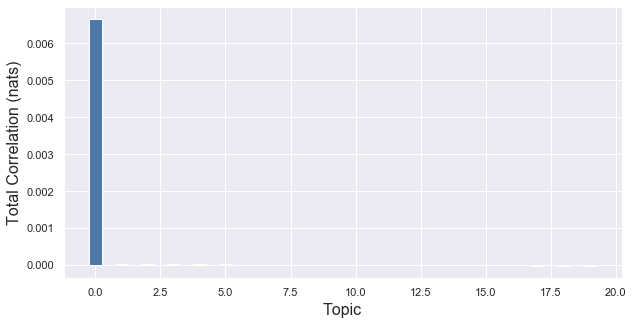

In [542]:
plt.figure(figsize=(10,5))
plt.bar(range(topic_model.tcs.shape[0]), topic_model.tcs, color='#4e79a7', width=0.5)
plt.xlabel('Topic', fontsize=16)
plt.ylabel('Total Correlation (nats)', fontsize=16);

## Anchored CorEx

In [573]:
# Anchor words
anchor_words = ([
    # The device specifics
    ['controller', 'phone', 'chromecast', 'device'],
    
    # Connectivity and Internet Access Issues:
    ['lag', 'wifi', 'internet'],
    
    # 
    ['game', 'platform', 'developer', 'new'],
    
    # Discussing the role of a subscription service
    ['subscription','exclusive','access','digital'],
    
    # Discussing the launch
    ['launch','preorder', 'release'],
    
    # Discussing the beta
    ['beta','release']
    
#     ['sports', 'stadium'],
])

anchored_topic_model = ct.Corex(n_hidden=20, seed=2)
anchored_topic_model.fit(doc_word, words=words, anchors=anchor_words, anchor_strength=12);

In [567]:
anchored_topic_model.tc

1.294672120288155

In [565]:
anchored_topic_model.tcs

array([ 6.27078109e-01,  6.68458125e-01, -1.41937201e-05, -2.69442394e-05,
       -3.03716578e-05, -1.17501376e-04,  2.97322913e-06, -2.26825170e-05,
       -1.35538797e-05, -1.87979789e-05, -5.38413482e-05, -2.26837889e-05,
       -1.39651185e-05, -1.32435532e-05, -1.06570363e-05, -5.03806690e-05,
       -1.73479422e-05, -6.50553672e-06, -5.65516881e-05, -1.90112247e-05,
       -4.42685805e-06, -1.80097051e-05, -3.64178332e-05, -1.81257397e-06,
       -5.87562139e-06, -1.56476269e-05, -2.20260209e-05,  5.89723216e-06,
       -1.52910205e-05, -2.39893058e-05, -8.86940107e-06,  2.86791843e-05,
        8.01088555e-07, -3.52093509e-06, -5.83724179e-05, -8.94374145e-06,
       -1.90900916e-05, -5.00307163e-06, -1.64072758e-05,  6.45678785e-08,
       -2.51423246e-05, -7.13886786e-05, -6.67149099e-06, -1.15548712e-05,
       -2.14194082e-05, -2.40544640e-05,  3.71216379e-05, -6.84076581e-07,
       -2.91295012e-05, -1.91633569e-05])

In [568]:
# Print all topics from the CorEx topic model
topics = anchored_topic_model.get_topics()
for n,topic in enumerate(topics):
    try:
        topic_words,_ = zip(*topic)
        print('{}: '.format(n) + ','.join(topic_words))
    except:
        continue

0: controller,phone,device,chromecast,connect,usb,use,tv,mouse,keyboard
1: game,new,platform,developer,play,console,free,buy,subscription,player
2: channel,custom,exact,personal
3: clearly,failure,guarantee,presentation,soon,source,weird,wish
4: eye,finally,literally,unlimited,website
5: accord,apparently,appreciate,random,site,suck,unit
6: ahead,ask,google,honest,near,question,redemption,rest,upload
7: beta,click,final
8: answer,datacenter,faster,late,series,seriously,sharing,surprised,topic,write
9: article,crazy,dumb,message
10: contact,discuss,minimum,perfectly,search,strong
11: arrive,everybody,feed,job,serious,worried
12: bug,call,image,report,response,sign,wait
13: 4k,common,edge,live,rate,skeptical,someone,though
14: basic,dead,definitely,find,logo,minute,ok,sometimes
15: blow,card,forget,misinformation,positive,research,rule,situation,slightly,statement
16: act,ago,block,day,fan
17: actual,area,know
18: address,bet,joke,music,speak
19: confirm,hear,ignore,manage,must


In [495]:
anchored_topic_model.tc

0.4084134540065164

In [472]:
# Print a single topic from CorEx topic model
topic_model.get_top_docs(topic=0, n_docs=10, sort_by='log_prob')

NOTE: 'docs' not provided to CorEx. Returning top docs as lists of row indices


[(11625, -0.0004919210677956087),
 (21464, -0.0006078469992338853),
 (14508, -0.0007146116241238953),
 (20858, -0.0007216529214730816),
 (8202, -0.0007714243176408786),
 (8156, -0.0007816328873575529),
 (19933, -0.001001564000707722),
 (12439, -0.001010761219784495),
 (17548, -0.001207533103533276),
 (13899, -0.0012117552976442791)]

In [479]:
df.iloc[17548].text

"Upgrading of consoles\n\n-Stadia can do this at anytime. They can just start using a different VM whenever it is cost effective to do so. There is nothing stopping google from upgrading their farm in 2 years. The major consoles have been on long lifecycles right now. Stadia doesn't have to wait for users to adapt a new platform like current consoles do. If Google upgraded their platform right before the release of the new consoles, it could have a major effect on the market as most people are speculating the new consoles to be comparable to current Stadia specs.\n\n\u200b\n\nGame streaming competitors (Geforce Now/Shadow)\n\n-While these are cool, there are a few things seperating them from Stadia. Generally they are setup so you can play games you already own via the cloud. This is actually very similar to what Stadia will do... with single player games. Google generally has a better network than them and has tons of edge nodes that will really help with latency even in single player

In [ ]:
# Print docs from that topic:


# Hive Plot Connection Data (offline viz)

In [97]:
db_filter = [
    {'$match': {'$and': [
                       {'score' : {'$gt': 5}}]}
    },
    {'$limit': 10}
]

db_projection = ([
    {'$project': {'_id': 0, 'id':1, 'created':1, 'author':1, 'score': 1, 'comments': {'author':1, 'score':1, 'created':1}}
    }
])

filter_and_projection = []
filter_and_projection.extend(db_filter)
filter_and_projection.extend(db_projection)

# Pull samples from Database

collection = db.scrape_nov19

threads = list( collection.aggregate(filter_and_projection))

# for thread in threads:
    
#     node = {}
    
# #     node['thread_id'] = thread['id']
    
#     # influencer
#     node['name'] = thread['author']
    
#     #influencee
#     node['targets'] = [c['author'] for c in thread['comments']]
    

#     nodes.append(node)

# nodes

# Flatten dictionary of submissions and their authors into dataframe:

In [98]:
threads[0]

{'author': 'RootAtAnonymous',
 'created': 1574079444.0,
 'id': 'dxy41e',
 'score': 57,
 'comments': [{'author': 'l0ve-is-all-y0u-need',
   'created': 1574090927.0,
   'score': 3},
  {'author': 'EDPZ', 'created': 1574079874.0, 'score': 6},
  {'author': 'BatPixi', 'created': 1574080276.0, 'score': 3},
  {'author': 'itsmoirob', 'created': 1574087359.0, 'score': 5},
  {'author': 'RootAtAnonymous', 'created': 1574082515.0, 'score': 4},
  {'author': 'Pneumah', 'created': 1574128980.0, 'score': 1},
  {'author': 'RootAtAnonymous', 'created': 1574082406.0, 'score': 3},
  {'author': 'some-nintendo-fan', 'created': 1574089214.0, 'score': 0},
  {'author': 'BatPixi', 'created': 1574084148.0, 'score': 2}]}

In [53]:
from collections import defaultdict

In [ ]:
nodesByName = defaultdict(set)

for thread in threads:
    
    thread_id = "thread." + thread['id']
    post_author = "author." +thread['author']
    commenters = ["comm." + c['author'] for c in thread['comments']]
    
    
    
    
    
    ## Add three types of nodes.
    
    # 1.
    # post author to commenters
    nodesByName[post_author].update(commenters)
    
    # 2.
    # thread id to author
    nodesByName[thread_id].add(post_author)
    
    # 3.
    # commenter to thread id
    for commenter in commenters:
        nodesByName[commenter].add(thread_id)
    
#     # influencee
    
#     node['targets'] = [c['author'] for c in thread['comments']]
#     # thread
#     node['targets'].append()
    

#     nodes.append(node)

links = []
for key, value in nodesByName.items():
    link = {}
    link['name'] = key
    link['type'] = key.split(".")[0]
    link['targets'] = list(value)
    links.append(link)

links

In [94]:
np.random.rand()

0.6821783076894833

In [91]:
# links_dict = {a[i]: a[i+1] for i in range(0, len(a), 2)}

ImportError: cannot import name 'izip' from 'itertools' (unknown location)

In [109]:
max_time = threads[0]['created']
min_time = threads[-1]['created']
date_diff = max_time - min_time

nodes = {}
links = []
axes = {'thread': 0, 'author': 1, 'commenter': 2, 'topic': 3}

for thread in threads:
    
    thread_id = "thread." + thread['id']
    author = "author." +thread['author']
    author_score = thread['score']
    commenters = [("commenter." + c['author'], c['score']) for c in thread['comments']]

    total_thread_score = 0
    
    time_interval = (thread['created'] - min_time) / date_diff
    ####  Update set of all nodes: ####
    
    # Author node
    nodeName = author
    nodeType = 'author'
    node = {'ax': nodeType, 'name': nodeName, 'distance': time_interval, 'total_score': author_score}
    try:
        nodes[nodeName]['total_score'] += author_score
    except:
        nodes[nodeName] = node

    # All commenter nodes
    for commenter, score in commenters:
        total_thread_score += score
        nodeName = commenter
        nodeType = 'commenter'
        node = {'ax': nodeType, 'name': nodeName, 'distance': time_interval, 'total_score': score}
        try:
            nodes[nodeName]['total_score'] += score
        except:
            nodes[nodeName] = node
            
        
    # Thread node
    nodeType = 'thread'
    nodeName = thread_id
    node = {'ax': nodeType, 'name': nodeName, 'distance': time_interval, 'total_score':score}
    nodes[nodeName] = node

    ####  Append to list of all links: ####

    ## Add link from author to commenters, and thread to commenters
    for commenter, score in commenters:
        target = commenter
        link = {'source': author, 'target':target}
        links.append(link)
        link = {'source': thread_id, 'target':target}
        links.append(link)

    # author to thread_id
    source = author
    target = thread_id
    link = {'source':source, 'target':target}
    links.append(link)

data = {'nodes': nodes, 'links': links, 'axes':axes }

pprint(data)

{'axes': {'author': 1, 'commenter': 2, 'thread': 0},
 'links': [{'source': 'author.RootAtAnonymous',
            'target': 'commenter.l0ve-is-all-y0u-need'},
           {'source': 'thread.dxy41e',
            'target': 'commenter.l0ve-is-all-y0u-need'},
           {'source': 'author.RootAtAnonymous', 'target': 'commenter.EDPZ'},
           {'source': 'thread.dxy41e', 'target': 'commenter.EDPZ'},
           {'source': 'author.RootAtAnonymous', 'target': 'commenter.BatPixi'},
           {'source': 'thread.dxy41e', 'target': 'commenter.BatPixi'},
           {'source': 'author.RootAtAnonymous',
            'target': 'commenter.itsmoirob'},
           {'source': 'thread.dxy41e', 'target': 'commenter.itsmoirob'},
           {'source': 'author.RootAtAnonymous',
            'target': 'commenter.RootAtAnonymous'},
           {'source': 'thread.dxy41e', 'target': 'commenter.RootAtAnonymous'},
           {'source': 'author.RootAtAnonymous', 'target': 'commenter.Pneumah'},
           {'source': 't

           'commenter.jessicalifts': {'ax': 'commenter',
                                      'distance': 0.7932767284699359,
                                      'name': 'commenter.jessicalifts',
                                      'total_score': 1},
           'commenter.jhildy73': {'ax': 'commenter',
                                  'distance': 0.28781840235661066,
                                  'name': 'commenter.jhildy73',
                                  'total_score': 3},
           'commenter.jimbosimbo43': {'ax': 'commenter',
                                      'distance': 0.0,
                                      'name': 'commenter.jimbosimbo43',
                                      'total_score': 4},
           'commenter.jjxlimit': {'ax': 'commenter',
                                  'distance': 0.28781840235661066,
                                  'name': 'commenter.jjxlimit',
                                  'total_score': 1},
           'commenter.jkibbe'

In [ ]:
links = []
for key, value in nodesByName.items():
    link = {}
    
    link['type'], link['name'] = key.split(".")
    link['targets'] = list(value)
    links.append(link)

links